In [1]:
import json
import extinction
%matplotlib inline
import numpy as np
import pymc3 as pm
import astropy.units as u
from scipy.stats import iqr
import matplotlib.pyplot as plt
from astropy.stats import mad_std
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
from astropy.coordinates import SkyCoord
from pandas.plotting import scatter_matrix
from astropy.cosmology import FlatLambdaCDM, Planck15
from scipy.interpolate import InterpolatedUnivariateSpline
cosmo_P = Planck15
import theano.tensor as T
import theano
lst_filter = ['g', 'r', 'i', 'z']
fltr_color = {'g' : 'C0', 'r' : 'C1', 'i' : 'C2', 'z' : 'C3'}
dict_filter = {'g' : 0, 'r' : 1, 'i' : 2, 'z' : 3}
varname = ['Log(Amplitude)', 'Tan(Plateau Angle)', 'Log(Plateau Duration)', 
           'Start Time', 'Log(Rise Time)', 'Log(Fall Time)']

/usr/local/anaconda3/lib/python3.7/site-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [2]:
##################################################################################################################
#HELPER FUNCTIONS
#good
def s2c(file_num):
    file = '/data/reu/fdauphin/PS1_MDS/PS1_Final/PS1_PS1MD_PSc' + file_num + '.snana.dat'
    with open(file) as infile:
        lst = []
        for line in infile:
            lst.append(line.split())
    return lst

#good
def clean_data(lst):
    lst_new = []
    lst_remove = ['nan', '-inf', 'inf']
    for row in lst:
        if row[6] not in lst_remove and row[7] not in lst_remove:
            lst_new.append(row)
    return lst_new

#good
def file_numbers(lst):
    lst_new = []
    for i in lst:
        lst_new.append(i[:-1])
    return np.array(lst_new)

#good
def filter_func(lst, flt):
    lst_new = []
    for row in lst:
        if row[2] == flt:
            lst_new.append(row)
    return lst_new

#good
def transpose(matrix):
    lst = []
    for i in range (len(matrix[0])):
        lst_ij = []
        for j in range (len(matrix)):
            lst_ij.append(matrix[j][i])
        lst.append(lst_ij)
    return lst

#good
def fltr_2_lmbd(flt):
    if flt == 'g':
        x = 4866.
    elif flt == 'r':
        x =  6215.
    elif flt == 'i':
        x = 7545.
    elif flt == 'z':
        x = 9633.
    return np.array([x])

#good
def three_places(x):
    for i in range (len(x)):
        if x[i] == '.':
            index = i
    part_1 = x[:index]
    part_2 = x[index:]
    while len(part_2) != 4:
        part_2 += '0'
    return part_1 + part_2

#good
def host_spec(file_num):
    lst = []
    for i in range (len(db[file_num]['HostSpec'])):
        lst.append(db[file_num]['HostSpec'][i]['TonryDavisR'])
    for i in lst:
        if i > 4:
            return True
    return False

#good
def min_max(lst):
    q3, q1 = np.percentile(lst, [75 ,25])
    iqr = q3 - q1
    minimum = q1 - 1.5 * iqr
    maximum = q3 + 1.5 * iqr
    return [minimum, maximum]

#good
def split(axis, fltr, unc):
    lst = np.transpose([axis, fltr])
    lst_new = []
    for i in range (len(lst_filter)):
        lst_ij = []
        for j in range (len(lst)):
            if lst[j][1] == lst_filter[i]:
                lst_ij.append([float(lst[j][0]), unc[j]]) #added unc
        lst_new.append(np.transpose(lst_ij))
    return lst_new

def error_prop(z_unc, m_unc, z):
    dmu_dd_sq = (5 / (np.log(10) * cosmo_P.comoving_distance(z).value)) ** 2
    dd_dz_sq = (3 * 10 ** 8 / cosmo_P.H(z).value) ** 2
    dk_dz_sq = (2.5 / (np.log(10) * (1 + z))) ** 2
    M_unc = m_unc ** 2 + (dmu_dd_sq * dd_dz_sq + dk_dz_sq) * z_unc ** 2
    return np.sqrt(M_unc)
##################################################################################################################

In [3]:
#MAIN FUNCTIONS
#good
def create_matrix(lst_num):
    matrix = []
    for i in lst_num:
        data = s2c(i)[17:-1]
        table = np.transpose(clean_data(data))
        lst_time = table[1].astype(float)
        lst_flux = table[4].astype(float)
        lst_flux_err = table[5].astype(float)
        lst_mag = table[6].astype(float)
        lst_mag_err = table[7].astype(float)
        lst_new = np.array([lst_time, lst_flux, lst_flux_err, lst_mag, lst_mag_err])
        matrix.append(np.array(lst_new))
    return matrix

#good
def create_filtered_matrix(lst_num):
    lst_new = [[], [], [], []]
    for i in lst_num:
        data = s2c(i)[17:-1]
        data_clean = clean_data(data)
        for j in range (len(lst_filter)):
            table = np.transpose(filter_func(data_clean, lst_filter[j]))
            if len(table) != 0:
                lst_time = table[1].astype(float)
                lst_flux = table[4].astype(float)
                lst_flux_err = table[5].astype(float)
                lst_mag = table[6].astype(float)
                lst_mag_err = table[7].astype(float)
                matrix = np.array([lst_time, lst_flux, lst_flux_err, lst_mag, lst_mag_err])
                lst_new[j].append(np.array(matrix))
    return lst_new

#good
def reduced(data):
    lst = []
    for i in range (len(data)):
        lst_ij = [len(data[i][0])]
        for j in range (len(data[i])):
            if j == 0:
                lst_ij.append(min(data[i][j]))
                lst_ij.append(max(data[i][j]))
                lst_ij.append(max(data[i][j]) - min(data[i][j]))
            else:
                element = data[i][j]
                lst_ij.append(np.mean(element))
                lst_ij.append(np.std(element))
                lst_ij.append(min(element))
                lst_ij.append(max(element))
        lst.append(np.array(lst_ij))
    data_reduced = np.transpose(lst)
    return data_reduced

#good
def reduced_filtered(data_filtered):
    matrix = []
    for data in data_filtered:
        lst = []
        for i in range (len(data)):
            lst_ij = [len(data[i][0])]
            for j in range (len(data[i])):
                if j == 0:
                    lst_ij.append(min(data[i][j]))
                    lst_ij.append(max(data[i][j]))
                    lst_ij.append(max(data[i][j]) - min(data[i][j]))
                else:
                    element = data[i][j]
                    lst_ij.append(np.mean(element))
                    lst_ij.append(np.std(element))
                    lst_ij.append(min(element))
                    lst_ij.append(max(element))
            lst.append(np.array(lst_ij))
        matrix.append(np.transpose(lst))
    return transpose(matrix)

#good
def histograms(data_reduced):
    lst_title = ['# of Data Points', 'Min Time', 'Max Time', 'Time Difference', 
             'Flux Mean', 'Flux StD', 'Flux Min', 'Flux Max', 
             'Flux Err Mean', 'Flux Err StD', 'Flux Err Min', 'Flux Err Max', 
             'Mag Mean', 'Mag StD', 'Mag Min', 'Mag Max', 
             'Mag Err Mean', 'Mag Err StD', 'Mag Err Min', 'Mag Err Max']
    for i in range (len(data_reduced)):
        minimum, maximum = min_max(data_reduced[i])
        outliers = []
        for j in range (len(data_reduced[i])):
            if data_reduced[i][j] < minimum or data_reduced[i][j] > maximum:
                outliers.append(data_reduced[i][j])
        dif = len(outliers) * 100. / len(data_reduced[i])
        plt.title(lst_title[i])
        counts, bins, ignored = plt.hist(data_reduced[i], bins = 20, range = [minimum, maximum])
        #counts, bins, ignored = plt.hist(data_reduced[i], bins = 20)
        print (np.mean(data_reduced[i]))
        print ('Range:', [np.round(minimum,3), np.round(maximum,3)])
        print ('# and Percentage Not Plotted', len(outliers), np.round(dif,3))
        plt.show()
    return None

#good
def histograms_filtered(drf):
    lst_title = ['# of Data Points', 'Min Time', 'Max Time', 'Time Difference', 
             'Flux Mean', 'Flux StD', 'Flux Min', 'Flux Max', 
             'Flux Err Mean', 'Flux Err StD', 'Flux Err Min', 'Flux Err Max', 
             'Mag Mean', 'Mag StD', 'Mag Min', 'Mag Max', 
             'Mag Err Mean', 'Mag Err StD', 'Mag Err Min', 'Mag Err Max']
    for i in range (len(drf)):
        for j in range (len(drf[i])):
            minimum, maximum = min_max(drf[i][j])
            plt.title(lst_title[i])
            counts, bins, ignored = plt.hist(drf[i][j], bins = 20, range = [minimum, maximum], 
                                             alpha = 0.5, edgecolor = 'k', label = lst_filter[j])
        plt.legend()
        plt.show()
    return None

#good
def create_coords(lst_num):
    lst = []
    for i in lst_num:
        data = s2c(i) 
        z = float(data[6][1])
        RA = float(data[3][1])
        D = float(data[4][1])
        lst.append([z, RA, D])
    spher_coords = np.transpose(lst)
    return spher_coords

#good
def create_map(spher_coords, lim):
    size = 20
    c = SkyCoord(ra = spher_coords[1] * u.degree, 
                 dec = spher_coords[2] * u.degree, 
                 distance = cosmo_P.luminosity_distance(spher_coords[0]))
    fig = plt.figure(figsize = (10,10))
    ax = fig.add_subplot(111, projection = '3d')
    plt.title('Map of PS1-MDS for z > 0; Limit = ' + str(lim) + ' Mpc', size = size)
    ax.scatter(0, 0, 0, s = 1000, c = 'black')
    ax.scatter(c.cartesian.x.value, c.cartesian.y.value, c.cartesian.z.value, s = 25)
    ax.set_xlabel('X (Mpc)', size = size, labelpad = size)
    ax.set_ylabel('Y (Mpc)', size = size, labelpad = size)
    ax.set_zlabel('Z (Mpc)', size = size, labelpad = size)
    if lim != 'Default':
        ax.set_xlim(-lim,lim)
        ax.set_ylim(-lim,lim)
        ax.set_zlim(-lim,lim)
    plt.show()
    return c

In [4]:
#implement peak time to all to get correct graphs
def z_m(lst_num):
    lst = []
    for i in lst_num:
        data = s2c(i)
        z = float(data[6][1])
        A_v = float(data[5][1]) * 3.1
        table = np.transpose(clean_data(data[17:-1]))
        lst_flux = table[4]
        max_flux = max(lst_flux.astype(float))
        index = np.where(lst_flux == three_places(str(max_flux)))[0][0]
        fltr = np.transpose(table)[index][2]
        A = extinction.ccm89(fltr_2_lmbd(fltr), A_v, 3.1)[0]
        min_m = min(table[6].astype(float))
        lst.append([z, min_m, A, fltr, max_flux])
    lst = np.transpose(lst)
    return lst

def z_vs_M(lst):
    z = lst[0].astype(float)
    m = lst[1].astype(float) + 5
    mu = cosmo_P.distmod(z).value
    A = lst[2].astype(float)
    k = 2.5 * np.log10(1 + z)
    M = m - mu - A + 27.5 + k
    #L = 4 * np.pi * cosmo_P.luminosity_distance(z).value ** 2 * 10 ** (-0.4 * m)
    z_unc = lst[5].astype(float)
    m_unc = lst[6].astype(float)
    M_unc = error_prop(z_unc, m_unc, z)
    fltr = lst[3]
    z_lst = split(z, fltr, z_unc)
    M_lst = split(M, fltr, M_unc)
    plt.figure(figsize = (10,10))
    plt.title('Redshift vs. Absolute Magnitude', size = 30)
    for i in range (len(z_lst)):
        #plt.plot(z_lst[i], M_lst[i], 'C'+str(i)+'o', ms = 4, label = lst_filter[i])
        plt.errorbar(z_lst[i][0], M_lst[i][0], yerr = M_lst[i][1], xerr = z_lst[i][1],
                     fmt = 'oC'+str(i) , ms = 1, label = lst_filter[i])
    #plt.plot([0,1.5], [-23, -23], 'k-', label = 'M = -23')
    #plt.plot([0,1.5], [-14, -14], 'k--', label = 'M = -14')
    plt.xlabel('z', fontsize = 30)
    plt.ylabel('M', fontsize = 30)
    plt.tick_params(labelsize = 20)
    #plt.xlim(-0.05,0.8)
    #plt.ylim(-13,-23)
    #plt.ylim(4,-36)
    plt.ylim(max(M) + 5, min(M) - 5)
    plt.legend(prop={'size': 20}, loc = 'lower right')
    plt.show()
    return [M, M_unc, z]

def z_m_filtered(lst_num):
    lst = [[], [], [], []]
    for i in lst_num:
        data = s2c(i)
        z = float(data[6][1])
        A_v = float(data[5][1]) * 3.1
        for j in range (len(lst_filter)):
            table = np.transpose(clean_data
                                 (filter_func
                                  (data[17:-1], lst_filter[j])))
            if len(table) != 0:
                lst_flux = table[4]
                max_flux = max(lst_flux.astype(float))
                index = np.where(lst_flux == three_places(str(max_flux)))[0][0]
                fltr = np.transpose(table)[index][2]
                A = extinction.ccm89(fltr_2_lmbd(fltr), A_v, 3.1)[0]
                min_m = min(table[6].astype(float))
                lst[j].append([z, min_m, A, fltr, max_flux])
    return lst

def z_vs_M_filtered(matrix):
    cnt = 0
    for i in matrix:
        lst = np.transpose(i)
        z = lst[0].astype(float)
        m = lst[1].astype(float) + 5
        mu = cosmo_P.distmod(z).value
        A = lst[2].astype(float)
        k = 2.5 * np.log10(1 + z)
        M = m - mu - A + 27.5 + k
        z_axis = np.linspace(0,1.5,100)
        M_axis = - cosmo_P.distmod(z_axis).value + 25 + 2.5 * np.log10(1 + z_axis)
        plt.figure(figsize = (10,10))
        plt.title('Redshift vs. Absolute Magnitude in ' + str(lst[3][0]) + ' band', size = 30)
        plt.plot(z, M, 'C'+str(cnt)+'o', ms = 5)
        #plt.plot(z_axis, M_axis, 'k-', lw = 3)
        plt.plot([0,1.5], [-23, -23], 'k-', lw = 5, label = 'M = -23')
        plt.plot([0,1.5], [-14, -14], 'k--', lw = 5, label = 'M = -14')
        plt.xlabel('z', fontsize = 30)
        plt.ylabel('M', fontsize = 30)
        plt.tick_params(labelsize = 20)
        plt.ylim(max(M) + 5, min(M) - 5)
        plt.legend(fontsize = 20)
        plt.show()
        cnt += 1
    return None

def z_m_event(lst_num):
    lst = []
    for i in lst_num:
        data = s2c(i)
        peak_time = float(data[7][1])
        z = float(data[6][1])
        z_unc = float(data[6][3])
        A_v = float(data[5][1]) * 3.1
        table = np.transpose(cut_outliers
                             (peak_event
                              (clean_data
                               (data[17:-1]), 100, peak_time), 12))
        lst_flux = table[4]
        max_flux = max(lst_flux.astype(float))
        index = np.where(lst_flux == three_places(str(max_flux)))[0][0]
        fltr = table[2][index] #transpose
        m_unc = float(table[7][index])
        A = extinction.ccm89(fltr_2_lmbd(fltr), A_v, 3.1)[0]
        min_m = min(table[6].astype(float))
        lst.append([z, min_m, A, fltr, max_flux, z_unc, m_unc])
    lst = np.transpose(lst)
    return lst

def z_m_filtered_event(lst_num):
    lst = [[], [], [], []]
    for i in lst_num:
        data = s2c(i)
        peak_time = float(data[7][1])
        z = float(data[6][1])
        A_v = float(data[5][1]) * 3.1
        for j in range (len(lst_filter)):
            table = cut_outliers(peak_event
                                 (clean_data
                                  (filter_func
                                   (data[17:-1], lst_filter[j])), 100, peak_time), 12)
            if len(table) != 0:
                table = np.transpose(table)
                lst_flux = table[4]
                max_flux = max(lst_flux.astype(float))
                index = np.where(lst_flux == three_places(str(max_flux)))[0][0]
                fltr = np.transpose(table)[index][2]
                A = extinction.ccm89(fltr_2_lmbd(fltr), A_v, 3.1)[0]
                min_m = min(table[6].astype(float))
                lst[j].append([z, min_m, A, fltr, max_flux])
    return lst

In [5]:
#could use this as main function to extract all information, 
def absolute_magnitude(file_num):
    data = s2c(file_num)
    peak_time = float(data[7][1])
    z = float(data[6][1])
    A_v = float(data[5][1]) * 3.1
    #table = np.transpose(clean_data(data[17:-1]))
    table = np.transpose(cut_outliers
                         (peak_event
                          (clean_data
                           (data[17:-1]), 100, peak_time), 12))
    lst_flux = table[4]
    max_flux = max(lst_flux.astype(float))
    index = np.where(lst_flux == three_places(str(max_flux)))[0][0]
    min_m = float(table[6][index])
    fltr = table[2][index]
    A = extinction.ccm89(fltr_2_lmbd(fltr), A_v, 3.1)[0]
    mu = cosmo_P.distmod(z).value
    k = 2.5 * np.log10(1 + z)
    M = min_m - mu - A + 32.5 + k
    return [M, z]

#good
def cut_outliers(data, multiplier):
    lst = []
    table = np.transpose(data)
    if len(table) > 0:
        flux = table[4].astype(float)
        madstd = mad_std(flux)
        for i in data:
            if float(i[4]) < multiplier * madstd:
                lst.append(i)
    return lst

#good
def peak_event(data, period, peak_time):
    lst = []
    for i in data:
        time_ij = float(i[1])
        if time_ij < peak_time + period and time_ij > peak_time - period:
            lst.append(i)
    return lst

#implement peak time into all light curve plots
def light_curve_filtered(file_num, fltr):
    data = s2c(file_num)
    peak_time = float(data[7][1])
    #table = np.transpose(filter_func(clean_data(data[17:-1]), fltr))
    table = np.transpose(filter_func
                         (cut_outliers
                          (clean_data
                           (data[17:-1]), 20), fltr))
    time = table[1].astype(float) - peak_time
    flux = table[4].astype(float)
    flux_unc = table[5].astype(float)
    plt.figure(figsize = (10,10))
    plt.title(file_num + ' Light Curve', size = 30)
    plt.xlabel('Time (MJD)', fontsize = 30)
    plt.ylabel('Flux (Units)', fontsize = 30)
    plt.tick_params(labelsize = 20)
    plt.plot(time, flux, fltr_color[fltr]+'o', ms = 5, label = fltr)
    plt.legend(fontsize = 20)
    plt.show()
    return None

#add in clean data between cut and data for + flux only
def light_curve_full(file_num):
    data = s2c(file_num)
    peak_time = float(data[7][1])
    plt.figure(figsize = (10,10))
    plt.title(file_num + ' Light Curve', size = 30)
    plt.xlabel('Time (Days from Peak MJD)', fontsize = 30)
    plt.ylabel('Flux (Units)', fontsize = 30)
    plt.tick_params(labelsize = 15)
    for i in range (len(lst_filter)):
        #table = np.transpose(filter_func((data[17:-1]), lst_filter[i]))
        table = np.transpose(filter_func(data[17:-1], lst_filter[i])) #cut outliers and clean
        time = table[1].astype(float) - peak_time
        flux = table[4].astype(float)
        flux_unc = table[5].astype(float)
        plt.plot(time, flux, 'C'+str(i)+'o', ms = 5, label = lst_filter[i])
        #plt.errorbar(time, flux, yerr = flux_unc, fmt = 'oC'+str(i) , ms = 3, label = lst_filter[i])
    plt.legend(fontsize = 20)
    plt.show()
    return None

def light_curve_event(file_num, period, multiplier):
    data = s2c(file_num)
    peak_time = float(data[7][1])
    event = peak_event(clean_data
                       (data[17:-1]), period, peak_time)
    plt.figure(figsize = (8,8))
    plt.title(file_num + ' Light Curve; Peak = ' + str(peak_time) + ' MJD', size = 25)
    plt.xlabel('Time (Days from Peak MJD)', fontsize = 30)
    plt.ylabel('Flux (Units)', fontsize = 30)
    plt.tick_params(labelsize = 15)
    for i in range (len(lst_filter)):
        table = np.transpose(filter_func
                             (cut_outliers
                              (event, multiplier), lst_filter[i]))
        if len(table) > 0:
            time = table[1].astype(float) - peak_time
            flux = table[4].astype(float)
            flux_unc = table[5].astype(float)
            #spl2 = InterpolatedUnivariateSpline(time, flux, k = 2)
            #xs = np.linspace(min(time), max(time), 100)
            plt.plot(time, flux, 'C'+str(i)+'o', ms = 5, label = lst_filter[i])
            #plt.errorbar(time, flux, yerr = flux_unc, fmt = 'oC'+str(i) , ms = 3, label = lst_filter[i])
            #plt.plot(xs, spl2(xs), 'C'+str(i)+'-', lw = 5, alpha = 0.1)
            #plt.show()
    plt.legend(fontsize = 20)
    plt.show()
    return None

In [6]:
with open('/data/reu/fdauphin/PS1_MDS/PS1_Spectra_all.json') as json_file:  
    db = json.load(json_file) 

def initialize():
    #all files
    F1 = open('/data/reu/fdauphin/PS1_MDS/PS1_Final/file_num_final')
    file_num = F1.readlines()
    lst_num = file_numbers(file_num)
    #--> all files in master
    F2 = open('/data/reu/fdauphin/PS1_MDS/PS1_master.v3.0.list')
    txt2 = F2.readlines()
    lst_master = []
    for i in txt2:
        lst_master.append(i.split()[0][3:])
    master = []
    for i in lst_num:
        if i in lst_master:
            master.append(i)
    #--> all files in master with R > 4               
    R = []
    for i in master:
        if host_spec(i) == True:
            R.append(i)
    #--> all files in master w/ R > 4 and z > 0             
    z = []
    for i in R:
        if float(s2c(i)[6][1]) > 0:
            z.append(i)
    #--> all files in master w/ R > 4 and z > 0 in good_lcs
    F3 = open('/data/reu/fdauphin/PS1_MDS/good_lcs.dat.txt')
    txt3 = F3.readlines()
    good_lcs = []
    for i in txt3:
        good_lcs.append(i.split()[0][3:])
    initial = []
    for i in z:
        if i in good_lcs and i != '000048':
            initial.append(i)
    #--> good master R > 4 z > 0 LLO
    F4 = open('/data/reu/fdauphin/PS1_MDS/LLO_Incorrect.txt')
    txt4 = F4.readlines()
    incorrect = []
    for i in range (len(txt4)-1):
        incorrect.append(txt4[i][3:9])
    correct = []
    for i in initial:
        if i not in incorrect:
            correct.append(i)
    return correct

def F(time):
    A = 1
    B = 0
    gamma = 100
    t_0 = 0
    t_1 = gamma + t_0
    tau_rise = 1
    tau_fall = 50
    t_less = []
    t_greater = []
    for t in time:
        if t < t_1:
            t_less.append(t)
        else:
            t_greater.append(t)
    t_less = np.array(t_less)
    t_greater = np.array(t_greater)
    F_less = ((A + B * (t_less - t_0)) / 
              (1. + np.exp((t_less - t_0) / -tau_rise)))
    F_greater = ((A + B * (t_1 - t_0)) * np.exp((t_greater - t_1) / -tau_fall) / 
                 (1. + np.exp((t_greater - t_0) / -tau_rise)))
    F = np.append(F_less, F_greater)
    #############################################################################
    #f_kar = A * (1 + B * (time - t_1) ** 2) * (np.exp(-(time - t_0) / tau_fall) / 
    #                                  (1 + np.exp(-(time - t_0) / tau_rise)))
    #f_baz = B + A * (np.exp(-(time - t_0) / tau_fall) / 
    #           (1 + np.exp((time - t_0) / tau_rise)))
    #############################################################################
    plt.figure(figsize = (10,10))
    plt.title('Model Light Curve', size = 30)
    plt.xlabel('Model Phase', fontsize = 30)
    plt.ylabel('Model Flux', fontsize = 30)
    plt.tick_params(labelsize = 20)
    plt.plot(time, F, 'r-', lw = 3, label = 'Villar')
    #plt.plot(time, f_kar, 'b-', lw = 3, label = 'Kar')
    #plt.plot(time, f_baz, 'g-', lw = 3, label = 'Baz')
    #plt.plot(t_less, F_less, 'r-', label = 't < t_1')
    #plt.plot(t_greater, F_greater, 'b-', label = 't >= t_1')
    #plt.legend(fontsize = 20)
    plt.show()
    return

In [7]:
lst_PS1 = initialize()

matrix = create_matrix(lst_PS1)
reduced_matrix = reduced(matrix)
#histograms(reduced_matrix)
filtered_matrix = create_filtered_matrix(lst_PS1)
reduced_filtered_matrix = reduced_filtered(filtered_matrix)
#histograms_filtered(reduced_filtered_matrix)
#create_map(create_coords(lst_PS1), 'Default')

lst_z_m_event = z_m_event(lst_PS1)
#M_unc = z_vs_M(lst_z_m_event)
lst_z_m_filtered = z_m_filtered(lst_PS1)
#z_vs_M_filtered(lst_z_m_filtered)

time = np.linspace(-50,200,500)
#F(time)

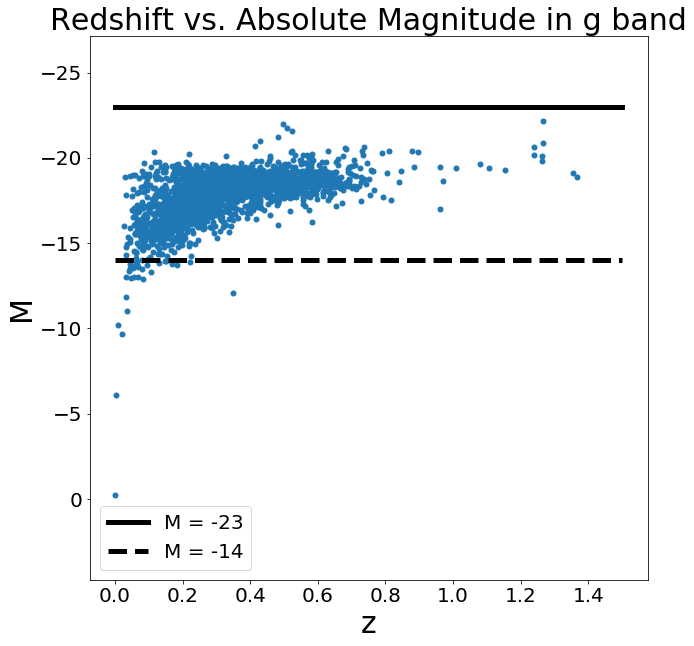

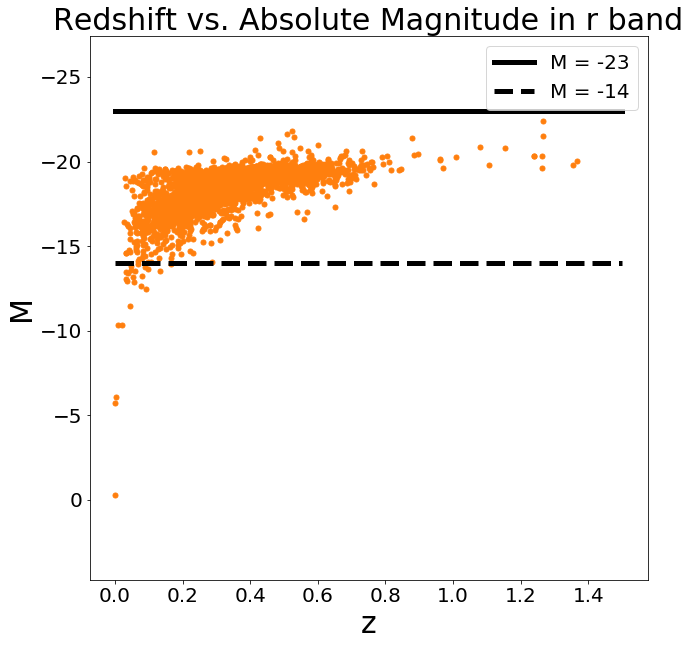

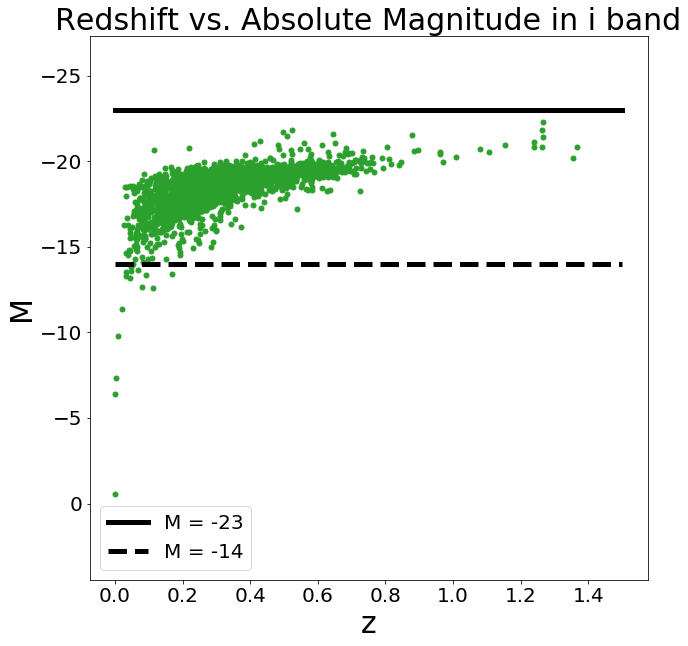

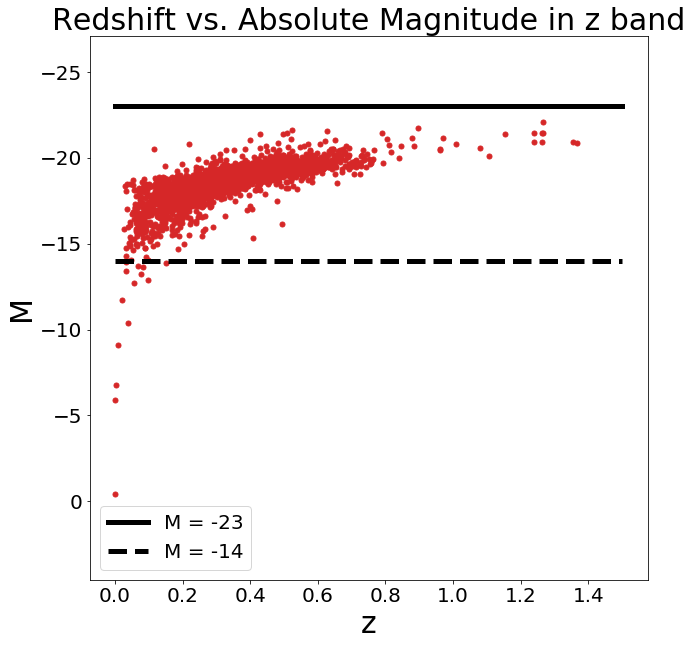

In [8]:
lst_z_m_filtered_event = z_m_filtered_event(lst_PS1)
z_vs_M_filtered(lst_z_m_filtered_event)

In [9]:
def run():
    M_unc = z_vs_M(lst_z_m_event)
    M = np.sort(M_unc[0])
    a = np.transpose(M_unc)
    lst = []
    for i in range (len(M)):
        for j in range (len(M_unc[0])):
            if M[i] == M_unc[0][j]:
                lst.append(a[j])
    b = np.transpose(a)
    x = np.linspace(0,1.4)
    y = 10 ** np.exp(-5*x)
    param, cov = curve_fit(func, b[2], np.log10(b[1]))
    plt.figure(figsize=(10,10))
    plt.plot(b[2], b[1], 'ko')
    #plt.plot(x, 10 ** func(x, *param), 'r-')
    plt.yscale('log')
    
def func(x, A, B, C, D, E):
    return A * B ** (C * x + D) + E

In [10]:
def get_parameters(file_num, plot):
    lst = []
    lst_peak = []
    lst_param = []
    for i in range (len(lst_filter)):
        data = s2c(file_num)
        peak_time = float(data[7][1])
        lst_peak.append(peak_time)
        event = filter_func(cut_outliers
                            (peak_event
                             ((data[17:-1]), 100, peak_time), 12), lst_filter[i])
        if len(event) != 0: #not in filter order anymore beware #check to see if this still true
            lst.append(event)
        else:
            lst_param.append([np.nan] * 6)
    prior = ([60, -30, 10, -50, 0.1, 1], [2000, 0, 200, 50, 50, 300])
    PRIOR = ([10, -150, 5, -50, 0.1, 1], [15000, 0, 300, 50, 50, 300])
    start = [250, -5, 100, -5, 5, 150]
    if plot == True:
        plt.figure(figsize = (10,10))
    for i in range (len(lst)):
        table = np.transpose(lst[i])
        time = table[1].astype(float) - lst_peak[i]
        t = np.linspace(time[0],time[-1],100)
        flux = table[4].astype(float)
        try:
            param, covariance = curve_fit(Func, time, flux, p0 = start, bounds = PRIOR)
        except RuntimeError as e:
            #print(file_num, e)
            param = [np.nan] * 6
        lst_param.append(param)
        if plot == True:
            plt.title
            plt.plot(time, flux, 'C'+str(i)+'o')
            plt.plot(t, Func(t, *param), 'C'+str(i)+'-', label = lst_filter[i])
            #spl2 = InterpolatedUnivariateSpline(t, Func(t, *param), k = 2)
            #xs = np.linspace(min(time), max(time), 100)
            #plt.plot(xs, spl2(xs), 'C'+str(i)+'-', label = lst_filter[i])
    if plot == True:
        plt.title(file_num + ' Light Curve Fit', size = 30)
        plt.xlabel('Time (Days from Peak MJD)', fontsize = 30)
        plt.ylabel('Flux (Units)', fontsize = 30)
        plt.tick_params(labelsize = 20)
        plt.legend(fontsize = 20)
        plt.show()
    return np.array(lst_param)

In [11]:
def Func(t, A, B, gamma, t_0, tau_rise, tau_fall):
    F = np.piecewise(t, [t < t_0 + gamma, t >= t_0 + gamma], 
                     [lambda t: ((A + B * (t - t_0)) / 
                                 (1. + np.exp((t - t_0) / -tau_rise))),
                      lambda t: ((A + B * (gamma)) * np.exp((t - gamma - t_0) / -tau_fall) / 
                                 (1. + np.exp((t - t_0) / -tau_rise)))])
    return F

In [12]:
#DO NOT DELETE ABOVE #%debug
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################
#print ('A: ', 10 ** trace_df.describe().drop('count').T.values[1][0] - param[0])
#print ('B: ', trace_df.describe().drop('count').T.values[0][0] - param[1])
#print ('\u03BB: ', 10 ** trace_df.describe().drop('count').T.values[2][0] - param[2])
#print ('t_0: ', trace_df.describe().drop('count').T.values[2][0] - param[3])
#print ('tau_rise: ', 10 ** trace_df.describe().drop('count').T.values[3][0] - param[4])
#print ('tau_fall: ', 10 ** trace_df.describe().drop('count').T.values[0][0] - param[5])
#print(trace['Amplitude'][-5:])
#print (pm.summary(trace).round(2))#.values
#print("P(Amplitude < 0) = ", (trace_df['Amp Log'] < 0).mean())
#pm.forestplot(trace);
#trace.get_values('Log(Amplitude)', combine = False)
#gamma = pm.DensityDist('Log(Plateau Duration)', logp)
#B = pm.DensityDist('Tan(Plateau Angle)', uniform_theta) 

In [13]:
def count_data_points(file_num):
    lst = []
    table = s2c(file_num)
    peak_time = float(table[7][1])
    for i in lst_filter:
    #raw data 4 years
        data_raw = filter_func(table[17:-1], i)
        len_data_raw = len(data_raw)
    #clean_data 4 years
        data_clean = clean_data(data_raw)
        len_data_clean = len(data_clean)
    #clean data 3 sigma 4 years
        flux_clean = np.transpose(data_clean)[4].astype(float)
        unc_clean = np.transpose(data_clean)[5].astype(float)
        data_3_sig = flux_clean - 3 * unc_clean
        len_data_3_sig = len(data_3_sig[data_3_sig >= 0])
    #raw event 6 months
        event_raw = peak_event(data_raw, 100, peak_time)
        len_event_raw = len(event_raw)
    #clean event 6 months
        event_clean = clean_data(event_raw)
        len_event_clean = len(event_clean)
    #clean event 3 sigma 6 months
        try:
            flux_event = np.transpose(event_clean)[4].astype(float)
            unc_event = np.transpose(event_clean)[5].astype(float)
            event_3_sig = flux_event - 3 * unc_event
            len_event_3_sig = len(event_3_sig[event_3_sig >= 0])
        except IndexError as e:
            #print(file_num, e)
            len_event_3_sig = np.nan
        lst.append([len_data_3_sig, len_event_3_sig])
    return lst
    #return [len_data_raw, len_data_clean, len_data_3_sig, len_event_raw, len_event_clean, len_event_3_sig]

In [14]:
def Func_switch(t, A, B, gamma, t_0, tau_rise, tau_fall):
    t_1 = t_0 + gamma
    F = T.switch((t < t_1),
                 ((A + B * (t - t_0)) / 
                  (1. + np.exp((t - t_0) / -tau_rise))),
                 ((A + B * (gamma)) * np.exp((t - gamma - t_0) / -tau_fall) / 
                  (1. + np.exp((t - t_0) / -tau_rise))))
    return F

In [15]:
def light_curve_event_data(file_num, period, multiplier, fltr):
    data = s2c(file_num)
    peak_time = float(data[7][1])
    event = peak_event(data[17:-1], period, peak_time) #took out clean
    for i in range (len(lst_filter)):
        table = np.transpose(filter_func
                             (cut_outliers #cutting outliers
                              (event, multiplier), lst_filter[i]))
        if len(table) > 0:
            time = table[1].astype(float) - peak_time
            flux = table[4].astype(float)
            flux_unc = table[5].astype(float)
            if lst_filter[i] == fltr:
                return np.array([time, flux, flux_unc])

In [16]:
def transform(lst):
    parameters = lst
    a = 10 ** parameters[0]
    b = np.tan(parameters[1])
    g = 10 ** parameters[2]
    tr = 10 ** parameters[4]
    tf = 10 ** parameters[5]
    trans = np.array([a, b, g, parameters[3], tr, tf])
    return trans
    
    
def true_transform(lst):
    parameters = lst[0][0]
    sig = lst[0][1]
    
    a = 10 ** parameters[0]
    b = np.tan(parameters[1])
    g = 10 ** parameters[2]
    tr = 10 ** parameters[4]
    tf = 10 ** parameters[5]
    trans = np.array([a, b, g, parameters[3], tr, tf])
    
    sig_a = 10 ** sig[0]
    sig_b = np.tan(sig[1])
    sig_g = 10 ** sig[2]
    sig_tr = 10 ** sig[4]
    sig_tf = 10 ** sig[5]
    trans_sig = np.array([sig_a, sig_b, sig_g, sig[3], sig_tr, sig_tf])
    
    return np.array([trans, trans_sig]), lst[1]

In [17]:
def SNe_LC_MCMC(file_num, fltr, iterations, tuning, walkers):

    obs = light_curve_event_data(file_num, 180, 20, fltr)
    param = get_parameters(file_num, False)[dict_filter[fltr]]
    
    with pm.Model() as SNe_LC_model_final:
    
        obs_time = obs[0]
        obs_flux = obs[1]
        obs_unc = obs[2]

        # Priors for unknown model parameters
        A = 10 ** pm.Uniform('Log(Amplitude)', lower = 0, upper = 6)
        B = np.tan(pm.Uniform('Tan(Plateau Angle)', lower = -1.56, upper = 0))
        gamma = 10 ** pm.Uniform('Log(Plateau Duration)', lower = -3, upper = 3)
        t_0 = pm.Uniform('Start Time', lower = -50, upper = 50)
        tau_rise = 10 ** pm.Uniform('Log(Rise Time)', lower = -3, upper = 3)
        tau_fall = 10 ** pm.Uniform('Log(Fall Time)', lower = -3, upper = 3)
        sigma = np.sqrt(pm.HalfNormal('sigma', sigma = 1) ** 2 + obs_unc ** 2) #kde
        parameters = [A, B, gamma, t_0, tau_rise, tau_fall]
    
        # Expected value of outcome
        #exp_flux = Func_switch(obs_time, A, param[1], gamma, t_0, tau_rise, tau_fall)
        exp_flux = Func_switch(obs_time, *parameters)
    
        # Likelihood (sampling distribution) of observations
        flux_post = pm.Normal('Flux_Post', mu = exp_flux, sigma = sigma, observed = obs_flux)
        trace = pm.sample(iterations, tune = tuning, cores = walkers, chains = walkers, step = pm.Metropolis())
        
    trace_df = pm.trace_to_dataframe(trace)
    print(trace_df.describe().drop('count').T)
    print (pm.gelman_rubin(trace))
    pm.traceplot(trace)
    scatter_matrix(trace_df, figsize=(15,15));
    pm.plot_posterior(trace)
    summary = np.transpose(pm.summary(trace).values)[:2]
    
    rand_param = []
    for i in range (1000):
        index = np.random.randint(0, walkers * iterations)
        lst = []
        for j in varname:
            lst.append(trace[j][index])
        rand_param.append(transform(lst))
    rand_param = np.array(rand_param)
    
    theo_time = np.linspace(obs_time[0], obs_time[-1], 100)
    plt.figure(figsize = (10,10))
    y_sum = 0
    for i in rand_param:
        y = Func(theo_time, *i)
        plt.plot(theo_time, y, 'k-', alpha = 0.1)
        y_sum += y
    flux_mean = y_sum / len(rand_param)
    plt.title(file_num + ' Light Curve in ' + fltr + ' band', size = 30)
    plt.errorbar(obs_time, obs_flux, obs_unc, fmt = 'og',  label = 'Observation')
    flux_scipy = Func(theo_time, *param)
    flux_pymc3 = Func(theo_time, *transform(summary[0]))
    #flux_pymc3 = Func(obs_time, 10 ** summary[0][0], param[1], 10 ** summary[0][1],
     #             summary[0][2], 10 ** summary[0][3], 10 ** summary[0][4])
    #plt.plot(theo_time, flux_scipy, 'r-', label = 'SciPy')
    plt.plot(theo_time, flux_pymc3, 'r-', lw = 3, label = 'PyMC3')
    plt.plot(theo_time, flux_mean, 'y-', lw = 3,  label = 'Mean')
    plt.xlabel('Time (Days from Peak MJD)', fontsize = 30)
    plt.ylabel('Flux (Units)', fontsize = 30)
    plt.tick_params(labelsize = 20)
    plt.legend(fontsize = 20)
    plt.show()
    
    #return
    return [theo_time, flux_mean]

Multiprocess sampling (40 chains in 40 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 40 chains: 100%|██████████| 1400000/1400000 [07:14<00:00, 3221.81draws/s]
The gelman-rubin statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.307574  0.062768   2.203464   2.277687   2.310074   
Tan(Plateau Angle)     -1.055167  0.448662  -1.559920  -1.363711  -1.344850   
Log(Plateau Duration)   1.438127  0.478497  -2.997711   1.209892   1.606533   
Start Time            -33.694308  0.655565 -35.373862 -34.036582 -33.726355   
Log(Rise Time)          0.308681  0.071889  -0.672085   0.272573   0.312835   
Log(Fall Time)          0.233578  1.332820  -2.999987  -0.638500   0.988360   
sigma                   0.885518  0.859102   0.000007   0.343985   0.731599   

                             75%        max  
Log(Amplitude)          2.328234   3.803656  
Tan(Plateau Angle)     -0.721368  -0.000032  
Log(Plateau Duration)   1.706527   1.932952  
Start Time            -33.448888 -26.046945  
Log(Rise Time)          0.349457   0.822760  
Log(Fall Time)          1.188768   2.997666  
sigma                   1.252216  16.472150  

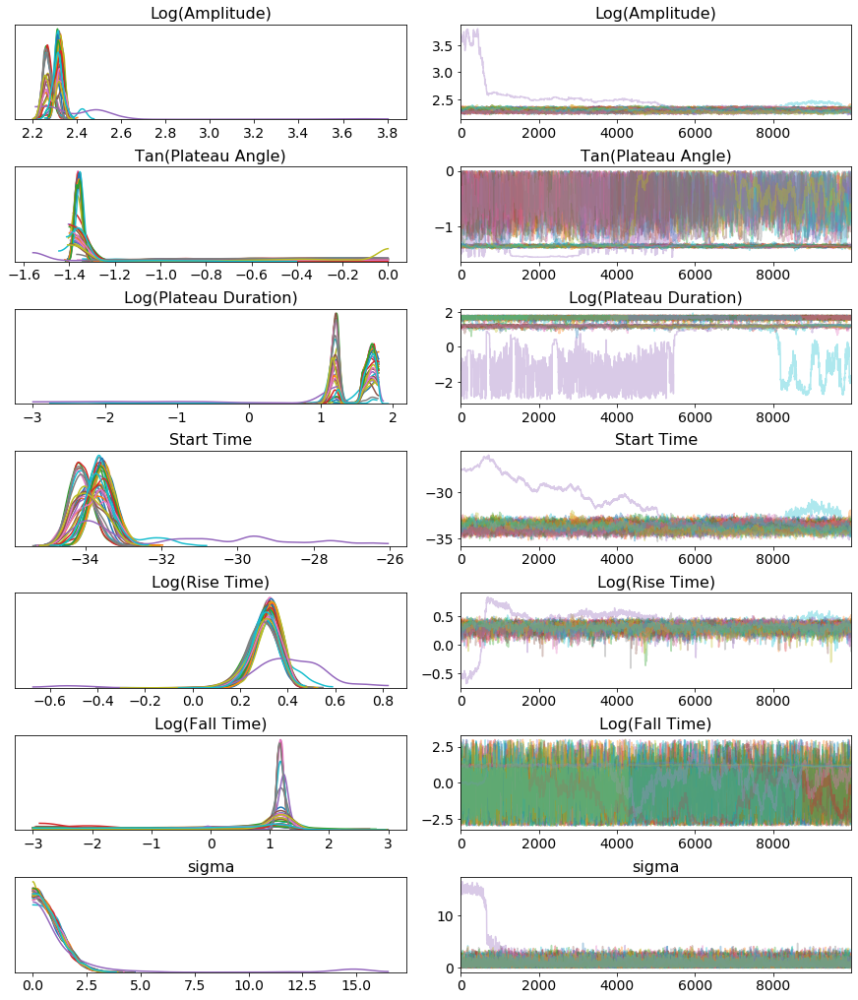

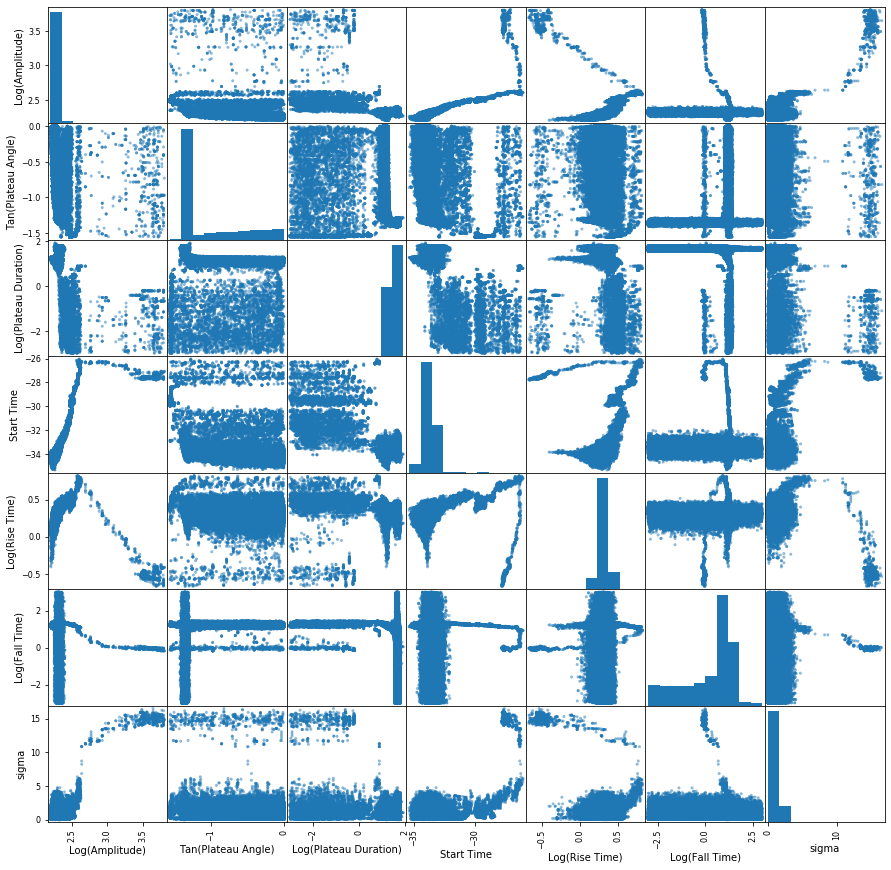

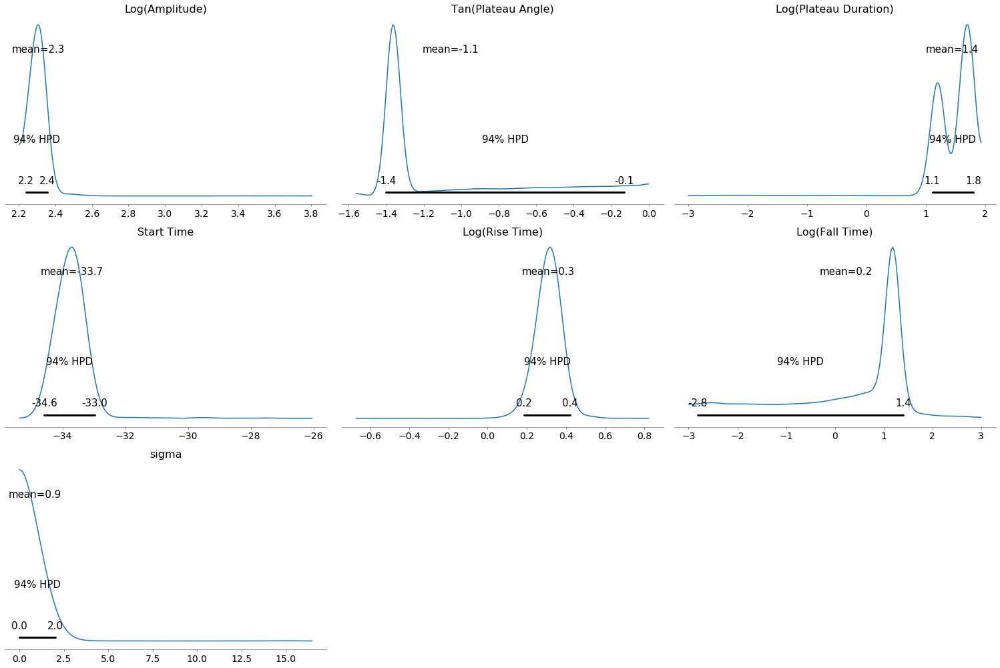

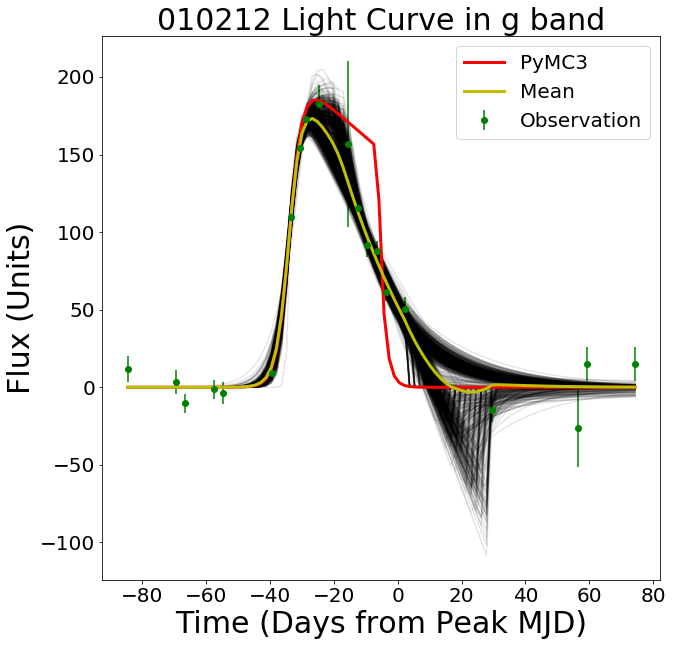

Multiprocess sampling (40 chains in 40 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 40 chains: 100%|██████████| 1400000/1400000 [07:33<00:00, 3085.48draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.487102  0.111020   2.310124   2.383911   2.430120   
Tan(Plateau Angle)     -0.955029  0.529168  -1.559999  -1.544954  -0.986811   
Log(Plateau Duration)   0.120097  1.483479  -2.999808  -1.214168   1.232300   
Start Time            -31.038301  3.096361 -35.492771 -33.779543 -32.879226   
Log(Rise Time)          0.538596  0.078744   0.268417   0.479026   0.530657   
Log(Fall Time)          1.320990  0.143513  -2.931852   1.289397   1.319701   
sigma                   0.956414  0.720631   0.000006   0.383684   0.805845   

                             75%        max  
Log(Amplitude)          2.604265   2.705094  
Tan(Plateau Angle)     -0.479929  -0.000058  
Log(Plateau Duration)   1.295858   1.780932  
Start Time            -27.941786 -22.020235  
Log(Rise Time)          0.587816   0.815742  
Log(Fall Time)          1.351446   2.904157  
sigma                   1.375338   5.733177  

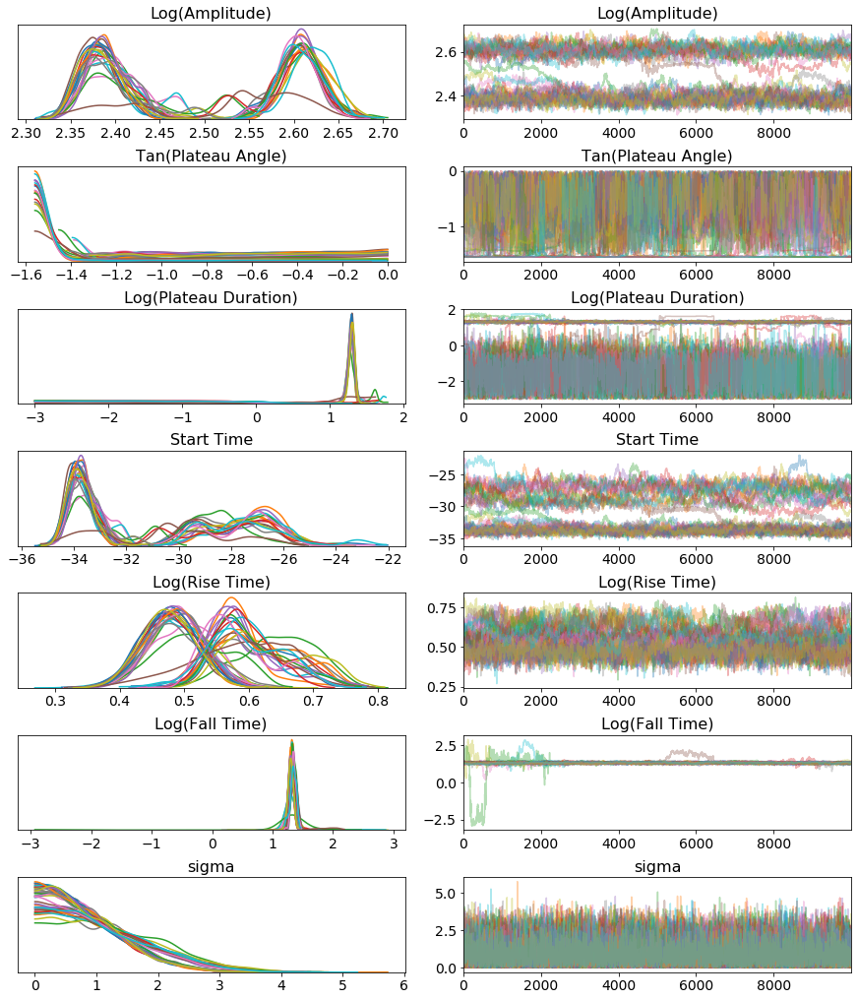

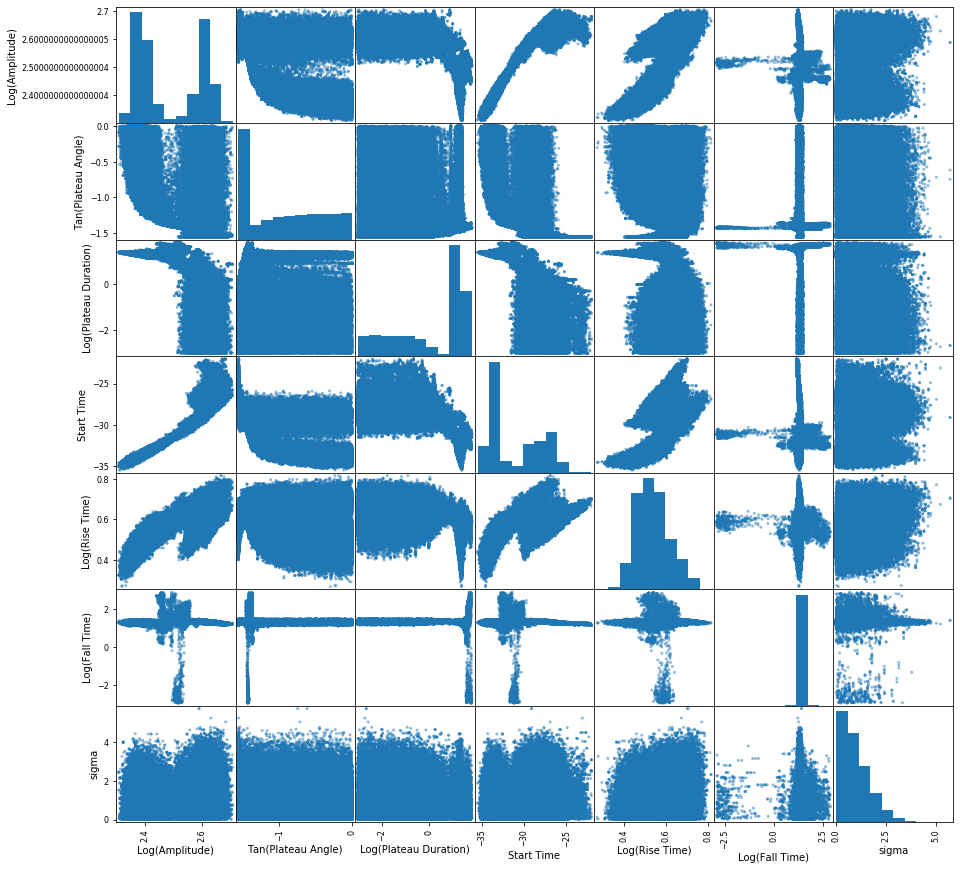

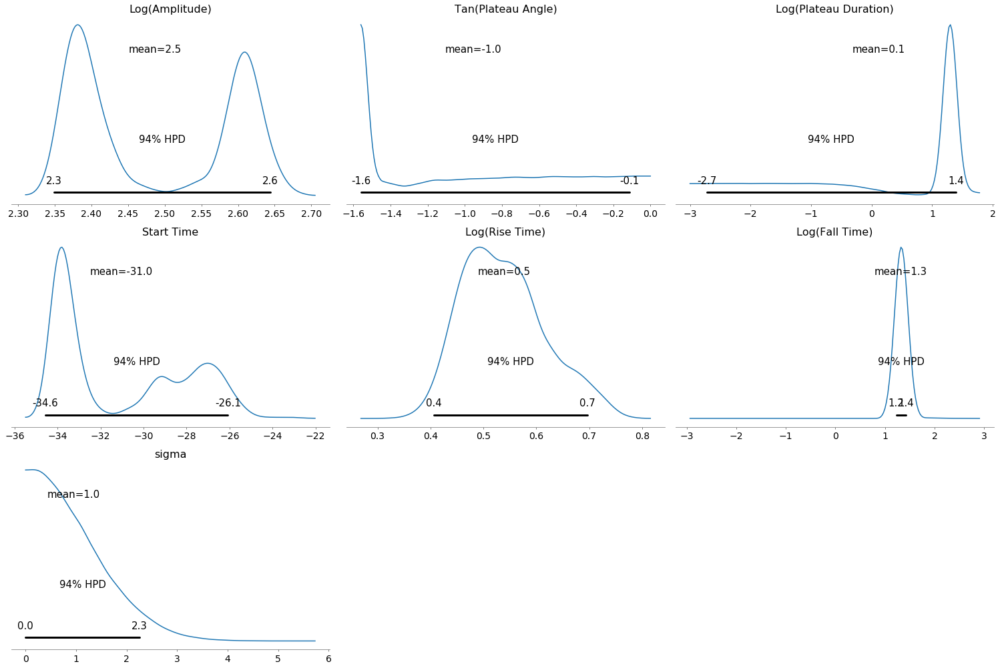

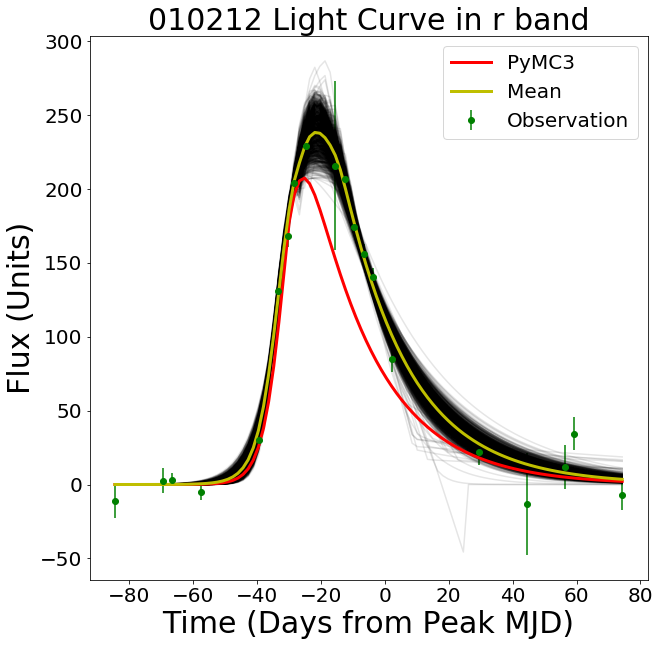

Multiprocess sampling (40 chains in 40 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 40 chains: 100%|██████████| 1400000/1400000 [07:30<00:00, 3106.69draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.477536  0.070326   2.327664   2.414921   2.457218   
Tan(Plateau Angle)     -0.946462  0.511933  -1.559946  -1.484728  -1.006731   
Log(Plateau Duration)   0.138460  1.373750  -2.999978  -0.955250   1.033353   
Start Time            -30.075483  1.721756 -33.661926 -31.579101 -30.679750   
Log(Rise Time)          0.579190  0.052892   0.384604   0.542546   0.574235   
Log(Fall Time)          1.438608  0.158134   1.119051   1.397905   1.421893   
sigma                   0.873988  0.650672   0.000001   0.353160   0.746406   

                             75%        max  
Log(Amplitude)          2.548435   2.639319  
Tan(Plateau Angle)     -0.485774  -0.000004  
Log(Plateau Duration)   1.152289   1.796928  
Start Time            -28.407797 -25.039055  
Log(Rise Time)          0.611784   0.776724  
Log(Fall Time)          1.445546   2.987717  
sigma                   1.263224   4.492507  

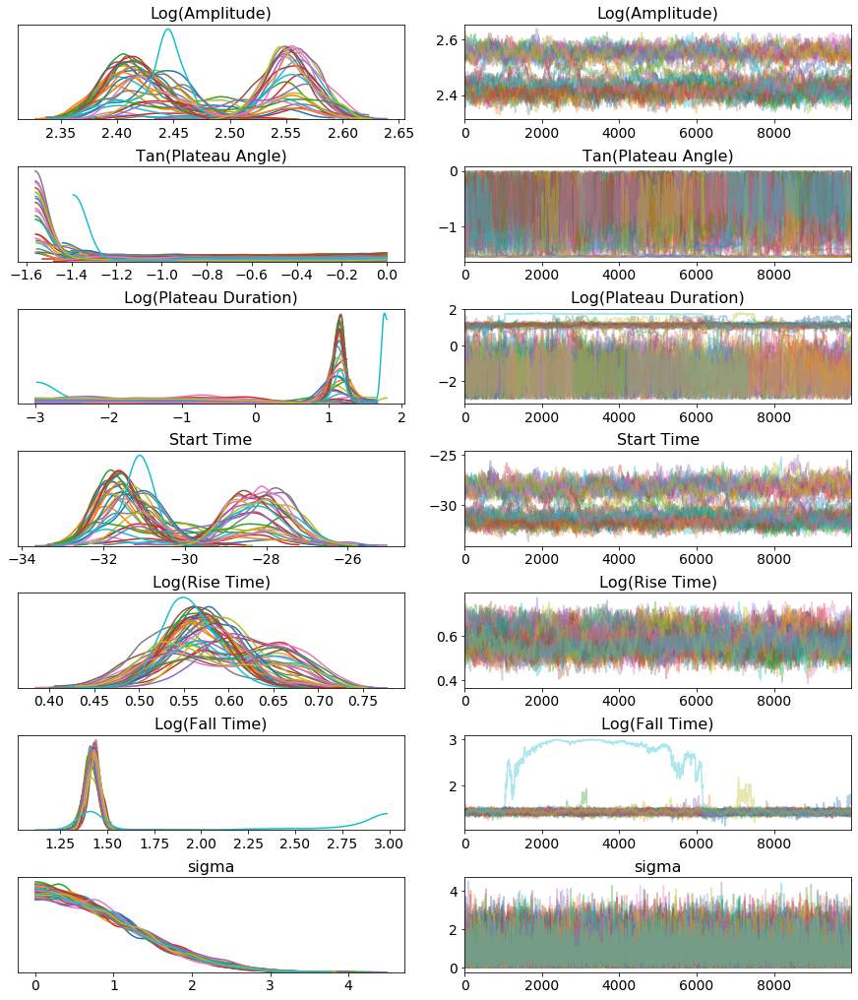

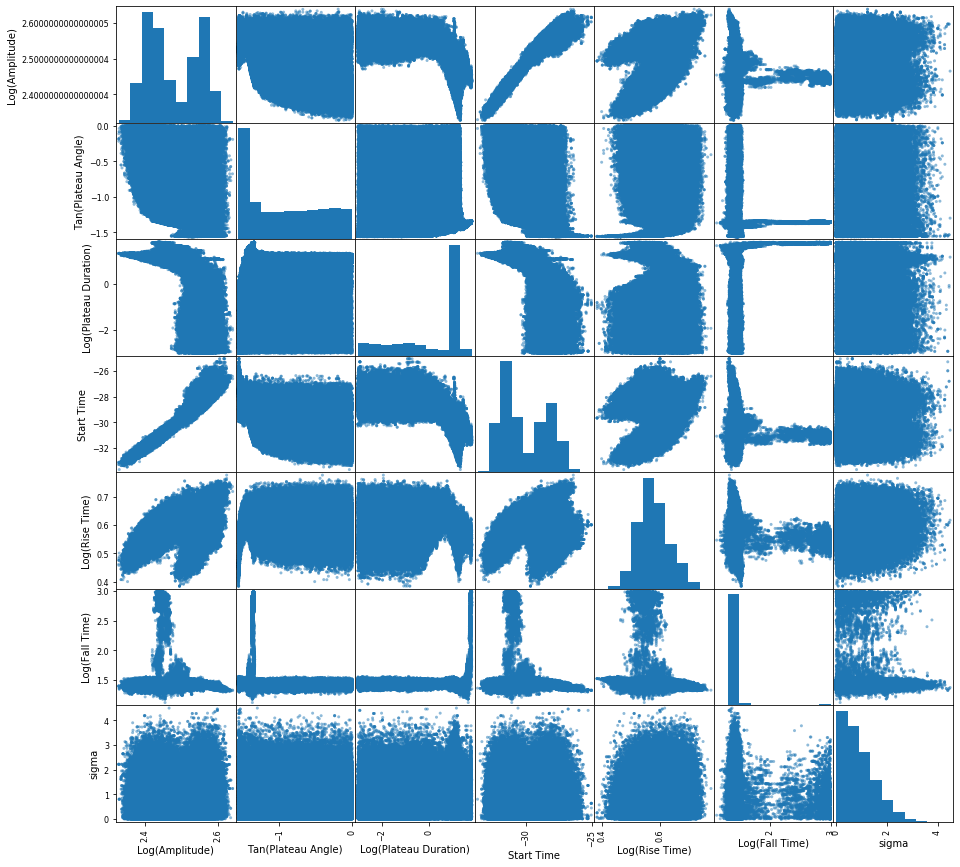

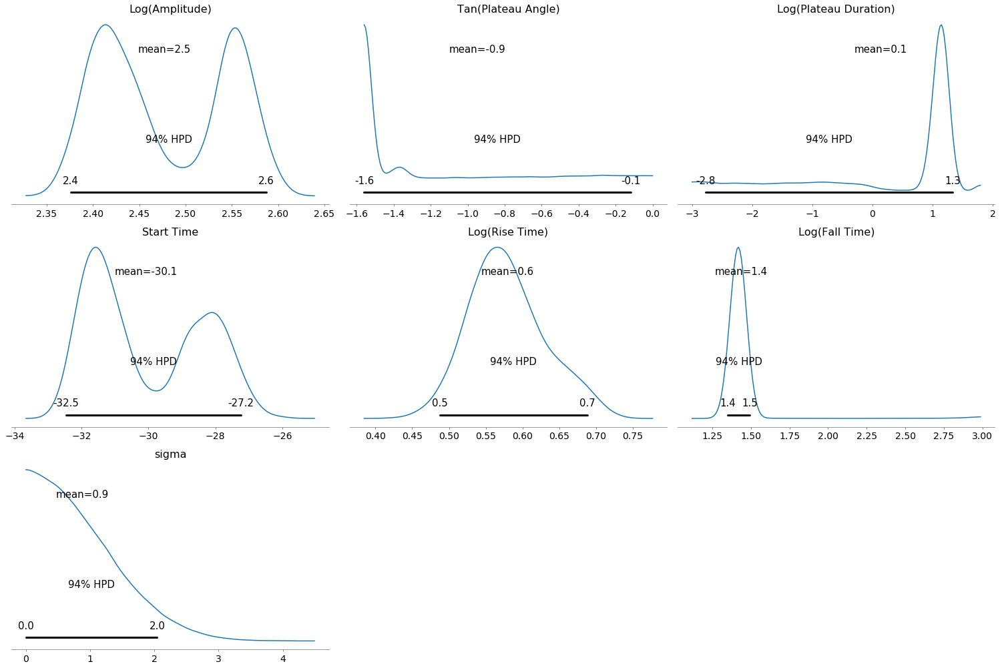

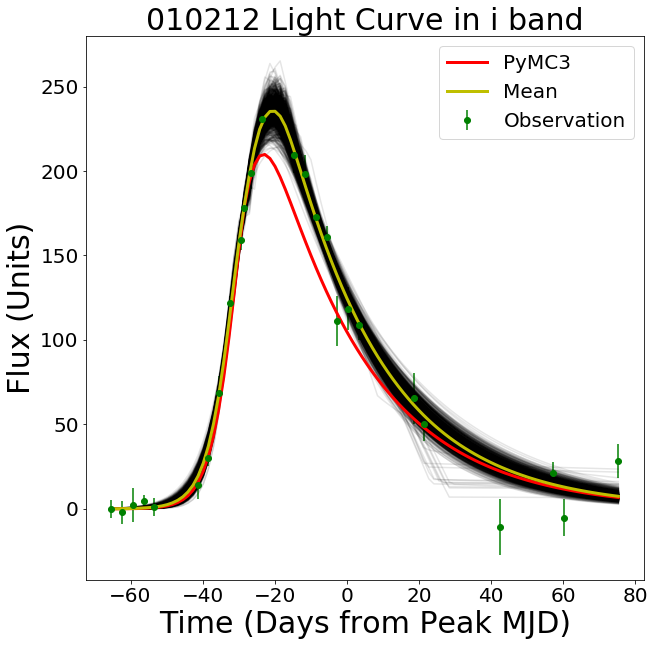

Multiprocess sampling (40 chains in 40 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 40 chains: 100%|██████████| 1400000/1400000 [07:25<00:00, 3143.43draws/s]
The number of effective samples is smaller than 10% for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.306298  0.060286   2.089372   2.268184   2.311504   
Tan(Plateau Angle)     -0.745688  0.437325  -1.559982  -1.114202  -0.743452   
Log(Plateau Duration)  -0.581521  1.439611  -2.999906  -1.822611  -0.629197   
Start Time            -33.160517  1.551414 -39.828346 -34.233636 -33.217742   
Log(Rise Time)          0.600021  0.110593  -0.119352   0.535038   0.612291   
Log(Fall Time)          1.644324  0.270106  -2.693372   1.590856   1.649449   
sigma                   0.834559  0.631716   0.000003   0.333184   0.704771   

                             75%        max  
Log(Amplitude)          2.348616   2.506251  
Tan(Plateau Angle)     -0.366659  -0.000007  
Log(Plateau Duration)   0.687953   2.999577  
Start Time            -32.188504 -24.887514  
Log(Rise Time)          0.677599   0.982635  
Log(Fall Time)          1.709926   2.995232  
sigma                   1.204696   5.129520  

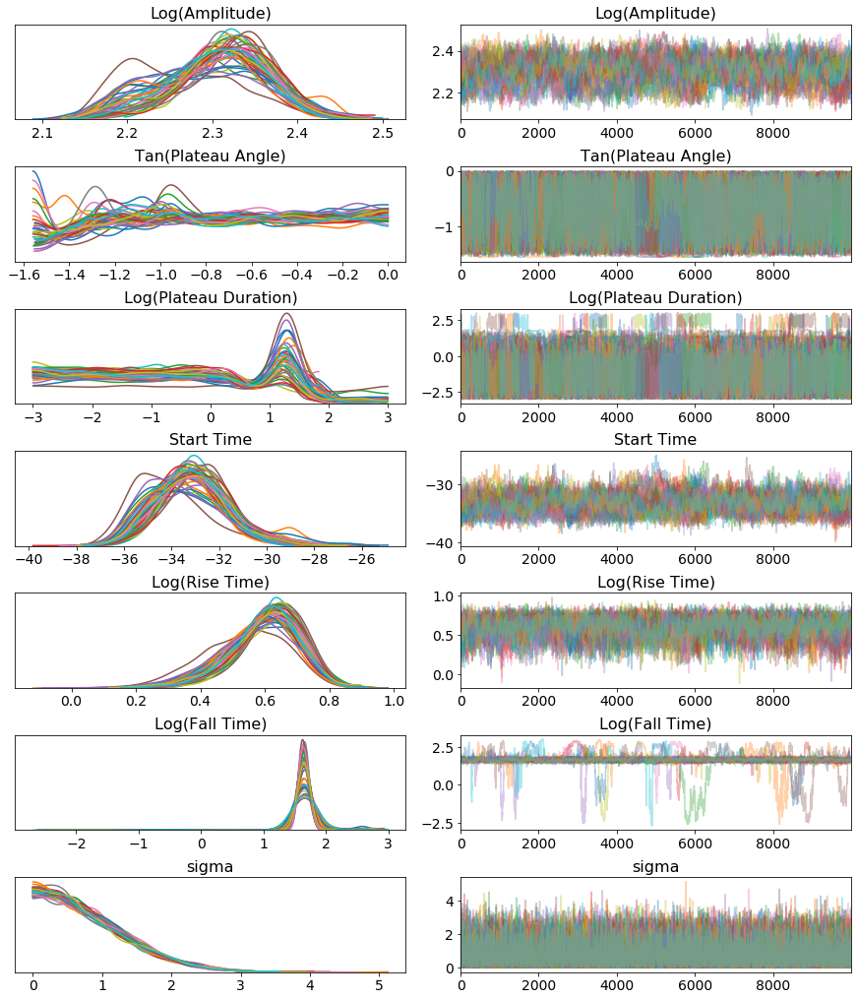

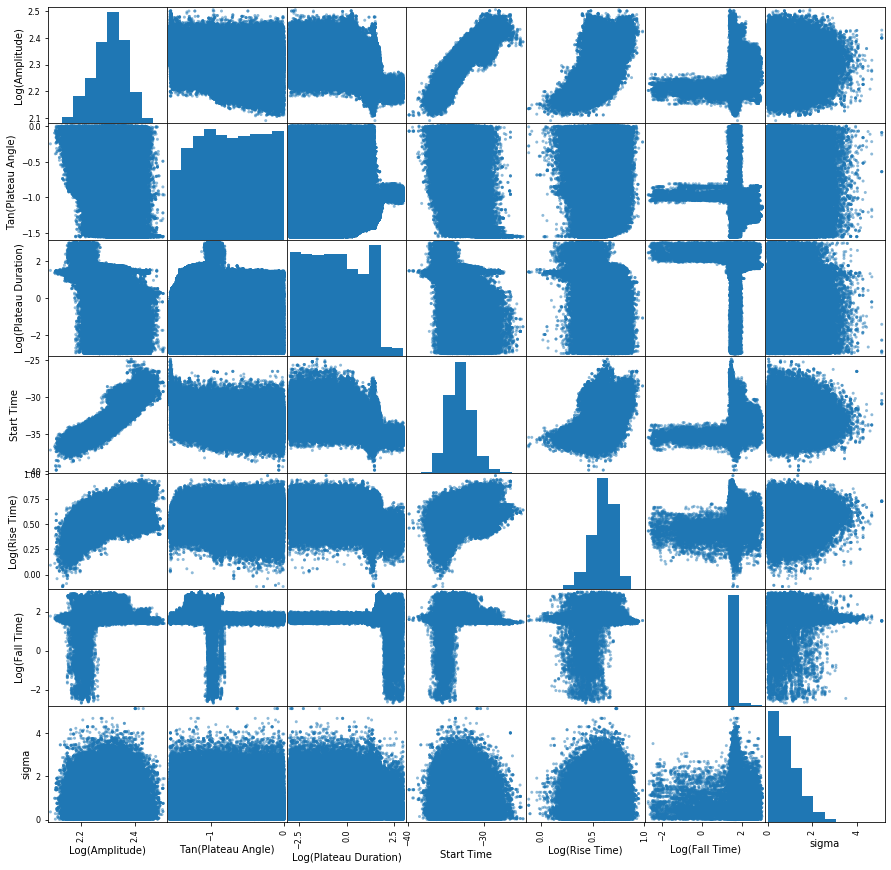

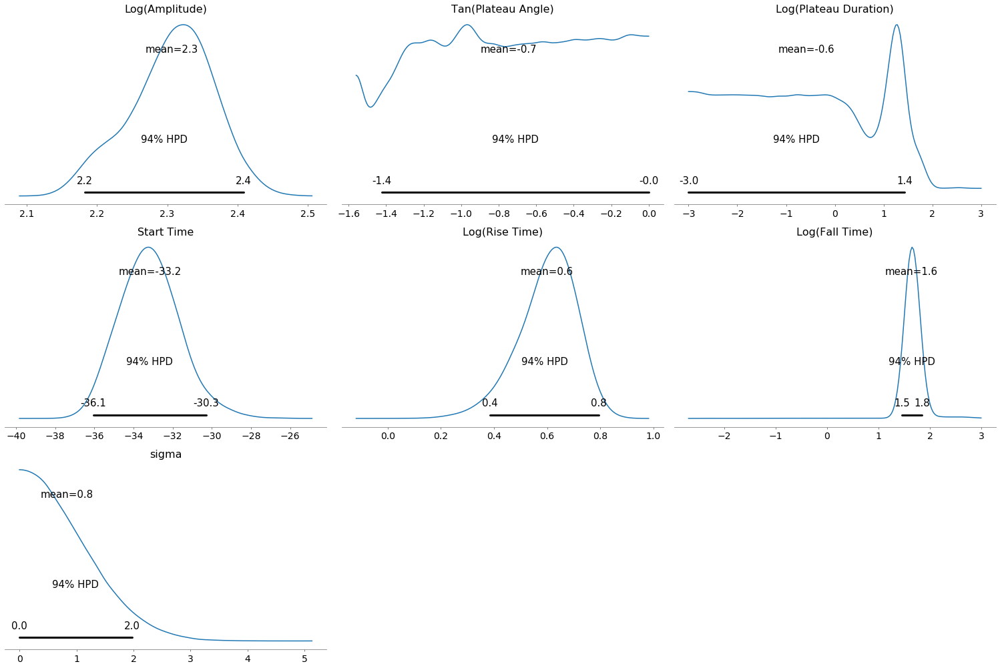

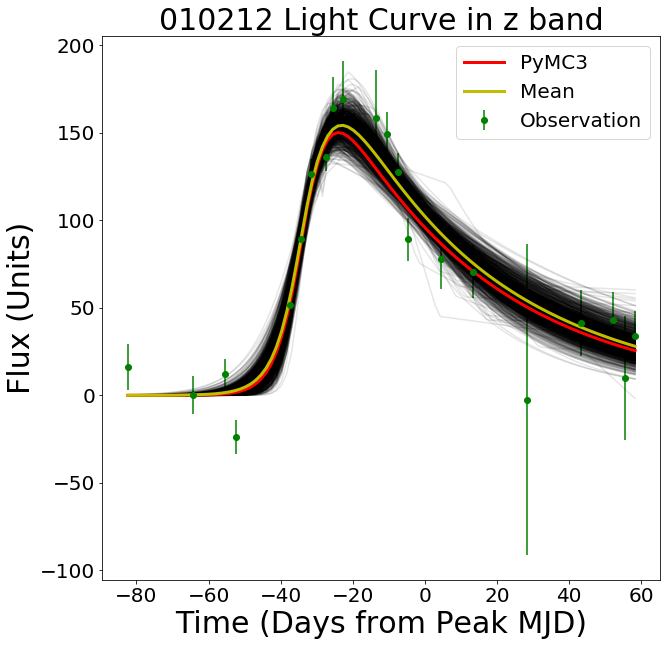

In [18]:
lst = []
for i in lst_filter:
    lst.append(SNe_LC_MCMC('010212', i, 10000, 25000, 40))

In [19]:
new_lst = np.array(lst)

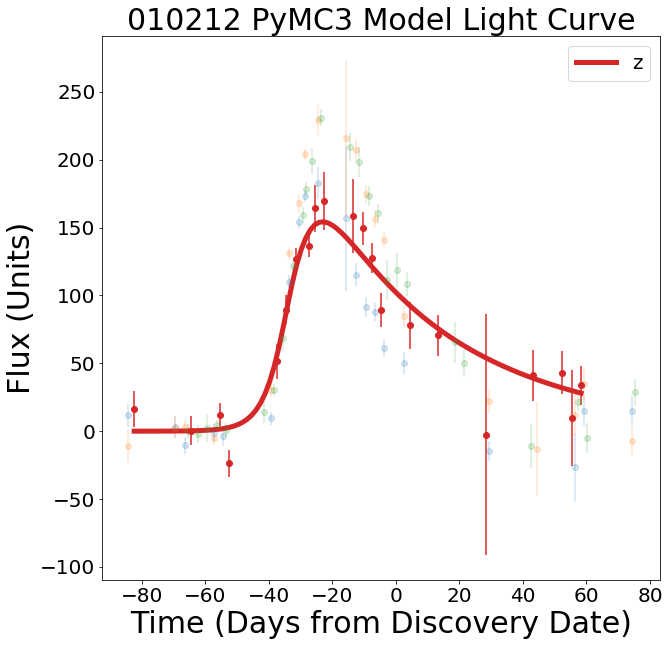

In [38]:
number = 3
plt.figure(figsize = (10,10))
plt.title('010212 PyMC3 Model Light Curve', size = 30)
for i in range (len(new_lst)):
    if i == number:
        alpha = 1
    else:
        alpha = 0.2
    obs = light_curve_event_data('010212', 180, 20, lst_filter[i])
    plt.errorbar(obs[0], obs[1], yerr = obs[2], fmt = 'oC'+str(i), alpha = alpha)
for i in range (number,number+1):    
    if i == number:
        alpha = 1
    else:
        alpha = 0.2
    plt.plot(new_lst[i][0], new_lst[i][1], 'C'+str(i)+'-', label = lst_filter[i], alpha = alpha, lw = 5)
plt.xlabel('Time (Days from Discovery Date)', fontsize = 30)
plt.ylabel('Flux (Units)', fontsize = 30)
plt.tick_params(labelsize = 20)
plt.legend(fontsize = 20)
plt.show()

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:25<00:00, 3523.65draws/s]
The estimated number of effective samples is smaller than 200 for some parameters.


                           mean       std        min       25%       50%  \
Log(Amplitude)         2.078117  0.082361   1.873206  2.015128  2.069142   
Tan(Plateau Angle)    -0.777491  0.424677  -1.559975 -1.127454 -0.823280   
Log(Plateau Duration) -0.397011  1.455183  -2.999915 -1.688133 -0.319372   
Start Time            -4.913247  4.144646 -14.386242 -8.009475 -4.035508   
Log(Rise Time)        -0.884556  1.130671  -2.999509 -1.866532 -0.781803   
Log(Fall Time)         1.232289  0.692559  -2.953823  1.297797  1.394710   
sigma                  0.780981  0.589663   0.000037  0.311110  0.664258   

                            75%       max  
Log(Amplitude)         2.135128  2.425362  
Tan(Plateau Angle)    -0.405168 -0.000028  
Log(Plateau Duration)  0.946184  1.964279  
Start Time            -1.410104  7.239810  
Log(Rise Time)         0.190965  1.047265  
Log(Fall Time)         1.466427  2.861692  
sigma                  1.127597  4.502384  
{'Log(Amplitude)': 1.0182378156150562, 

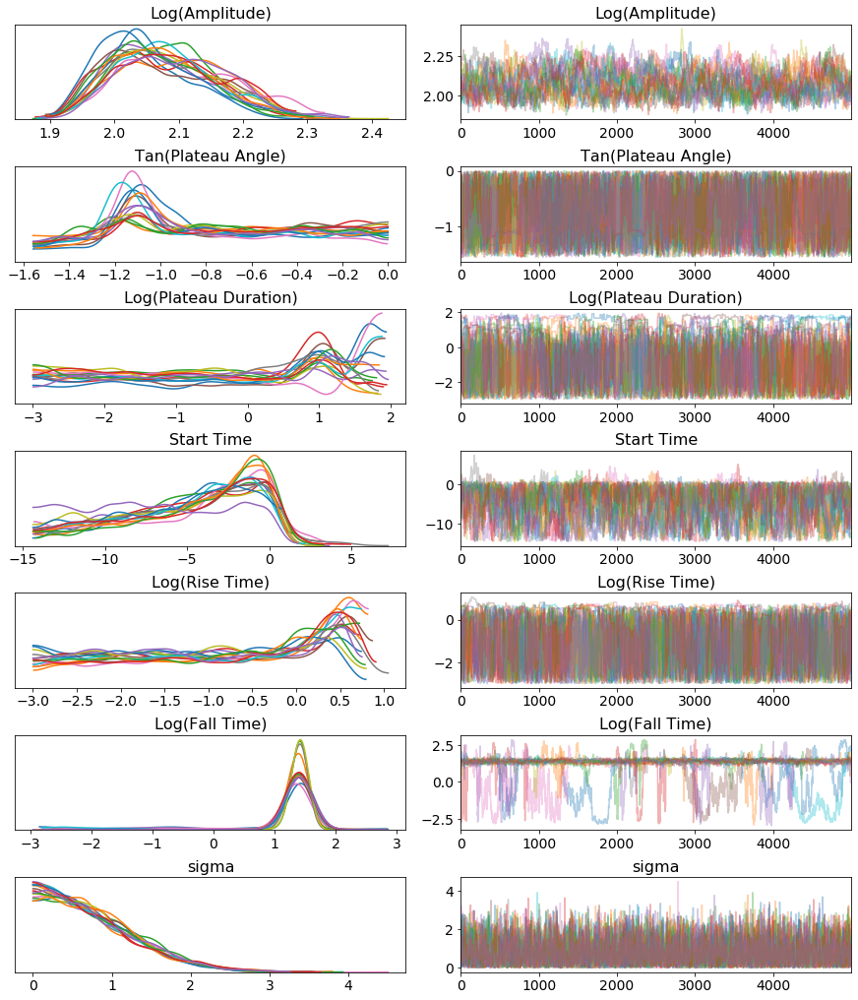

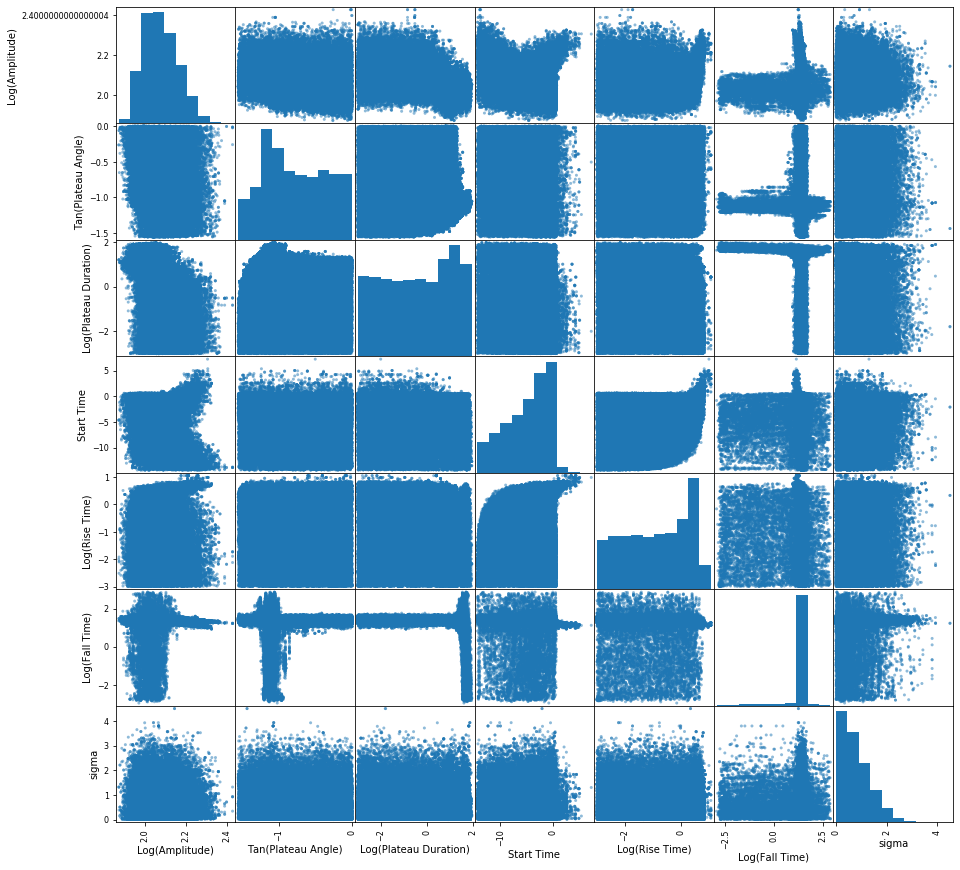

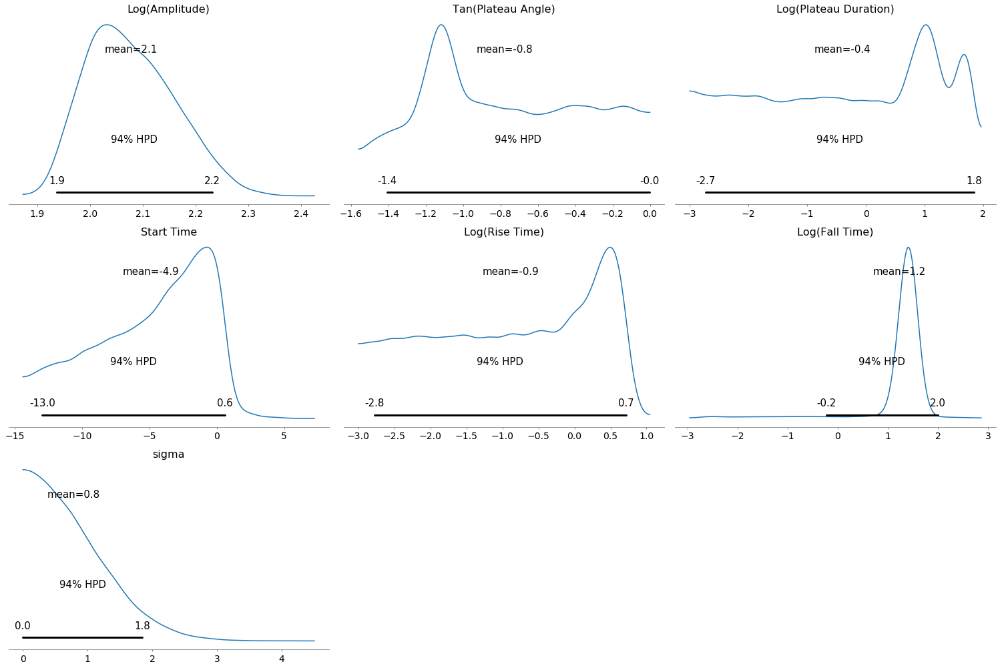

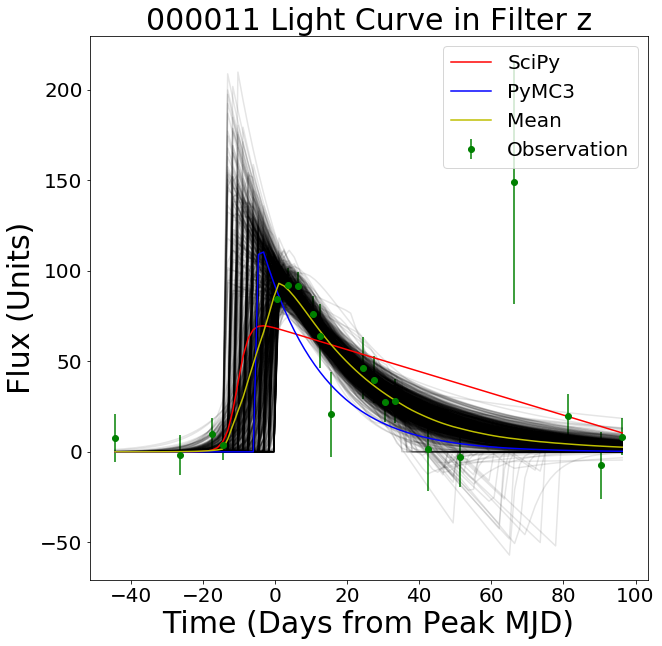

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:35<00:00, 3157.29draws/s]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.877883  0.030846   2.741570   2.859407   2.876626   
Tan(Plateau Angle)     -0.837710  0.477662  -1.559827  -1.283346  -0.847019   
Log(Plateau Duration)  -0.908724  1.426803  -2.999951  -2.052824  -1.076430   
Start Time            -13.113115  1.633302 -18.357227 -14.127373 -12.996148   
Log(Rise Time)          0.381426  0.149816  -0.856121   0.339053   0.414872   
Log(Fall Time)          1.497492  0.341495  -2.035668   1.454853   1.511422   
sigma                   0.789172  0.600883   0.000007   0.305755   0.665128   

                             75%       max  
Log(Amplitude)          2.894964  3.012536  
Tan(Plateau Angle)     -0.413788 -0.000006  
Log(Plateau Duration)  -0.074217  2.998776  
Start Time            -12.008701 -7.630425  
Log(Rise Time)          0.467074  0.659425  
Log(Fall Time)          1.563900  2.750341  
sigma                   1.137910  4.207569  
{'Log(A

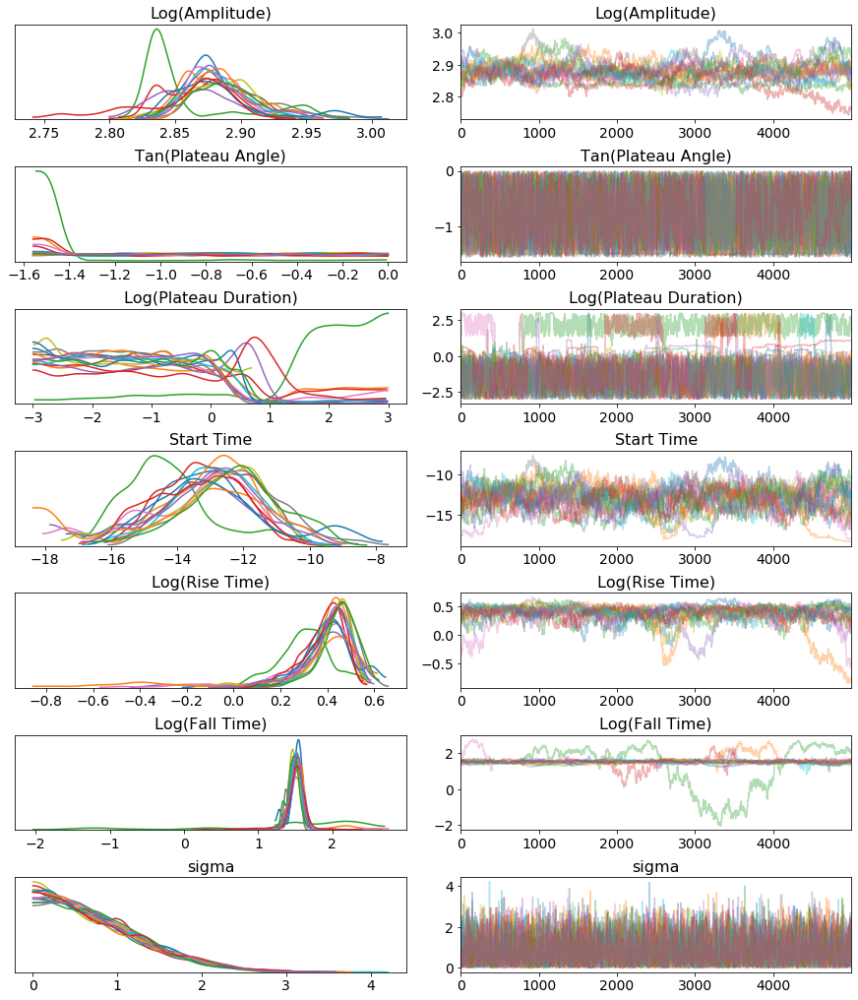

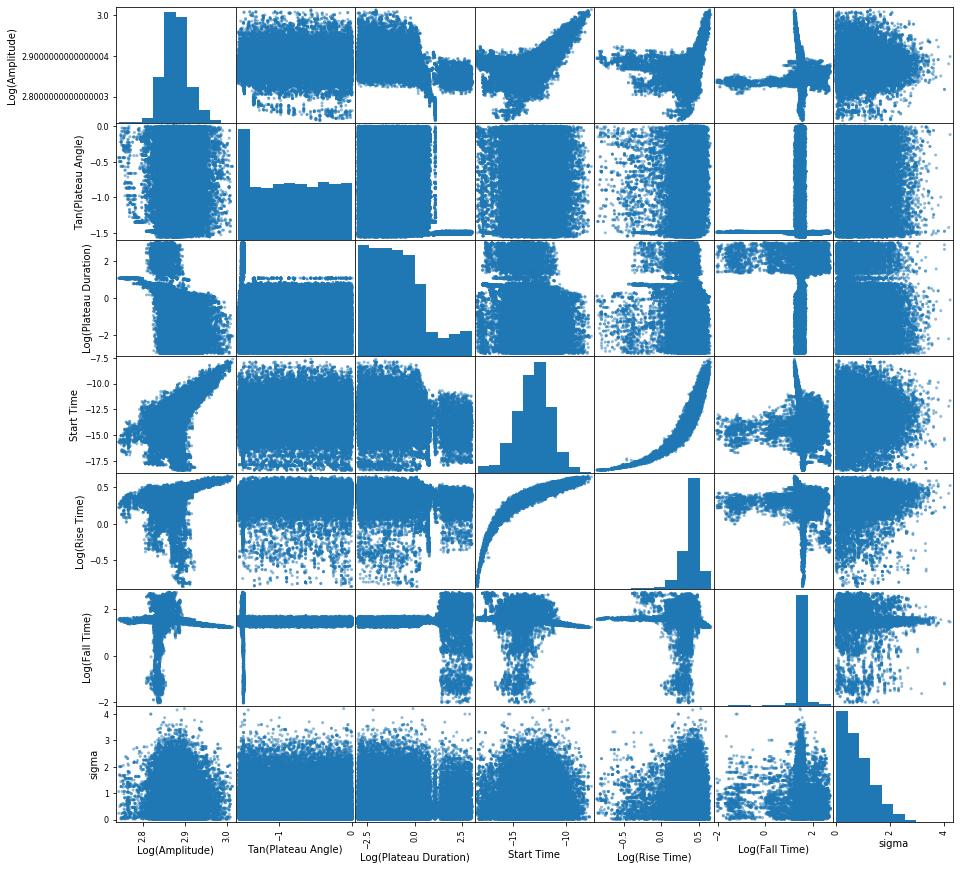

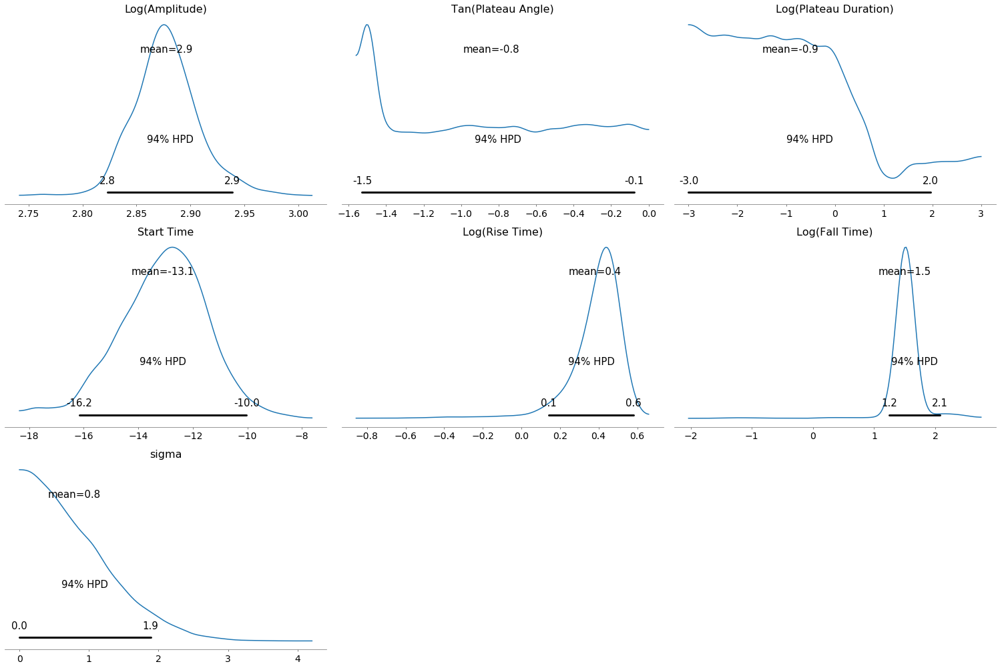

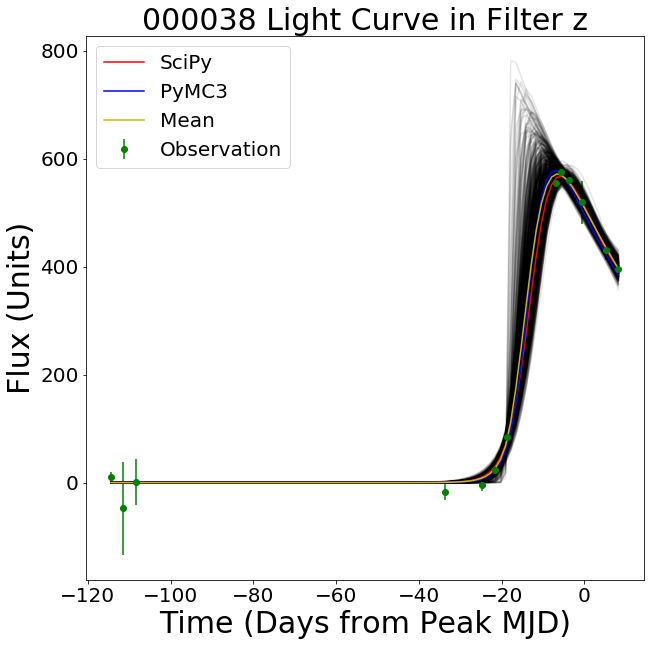

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:26<00:00, 3467.74draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                           mean       std       min       25%       50%  \
Log(Amplitude)         2.747102  0.029820  2.650462  2.717257  2.758133   
Tan(Plateau Angle)    -0.944501  0.479708 -1.559750 -1.438364 -1.029808   
Log(Plateau Duration) -0.358840  1.513885 -2.999972 -1.692788 -0.337099   
Start Time            -5.765763  0.331329 -7.222295 -6.019864 -5.688221   
Log(Rise Time)         0.321833  0.057090  0.097525  0.283720  0.326233   
Log(Fall Time)         1.567290  0.258961  0.923938  1.517726  1.534629   
sigma                  0.847082  0.633863  0.000056  0.342622  0.725350   

                            75%       max  
Log(Amplitude)         2.770670  2.822625  
Tan(Plateau Angle)    -0.527844 -0.000226  
Log(Plateau Duration)  0.934619  2.349758  
Start Time            -5.517570 -4.570606  
Log(Rise Time)         0.362609  0.522963  
Log(Fall Time)         1.550150  2.998260  
sigma                  1.219316  4.172910  
{'Log(Amplitude)': 1.4982513743930344, 'Tan(Pla

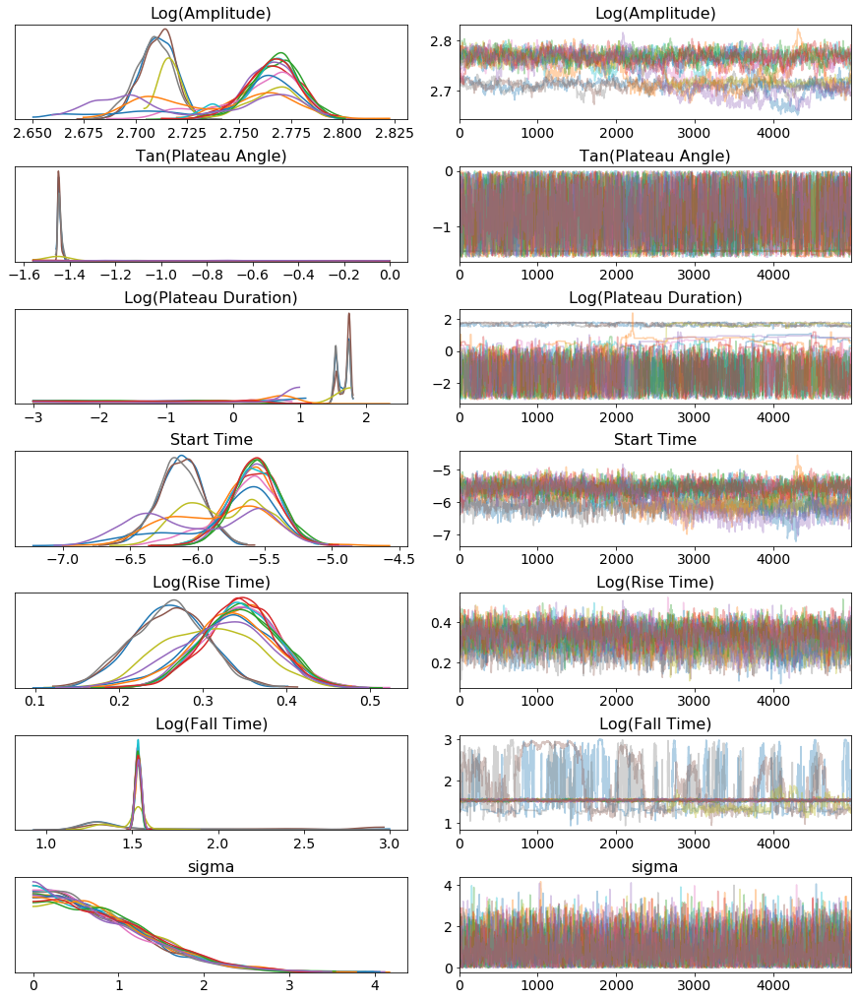

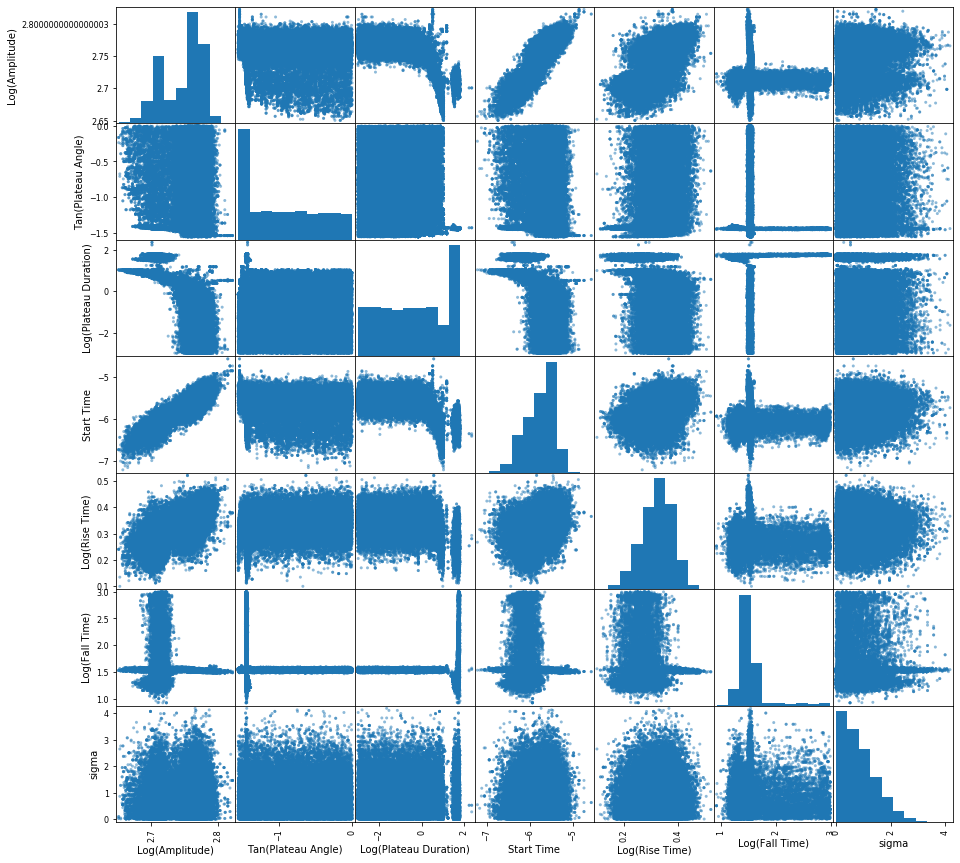

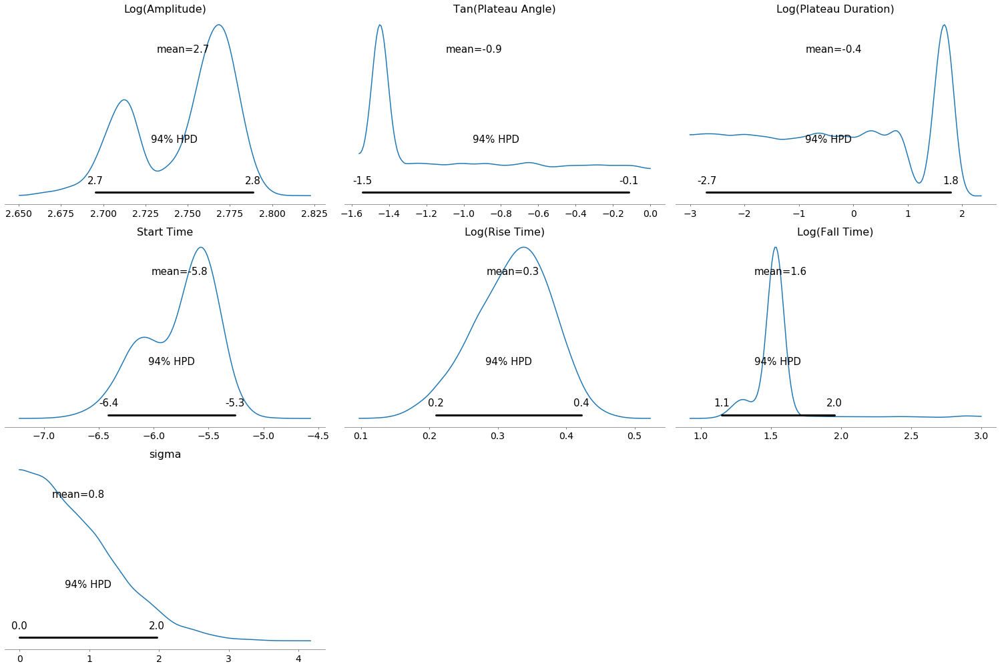

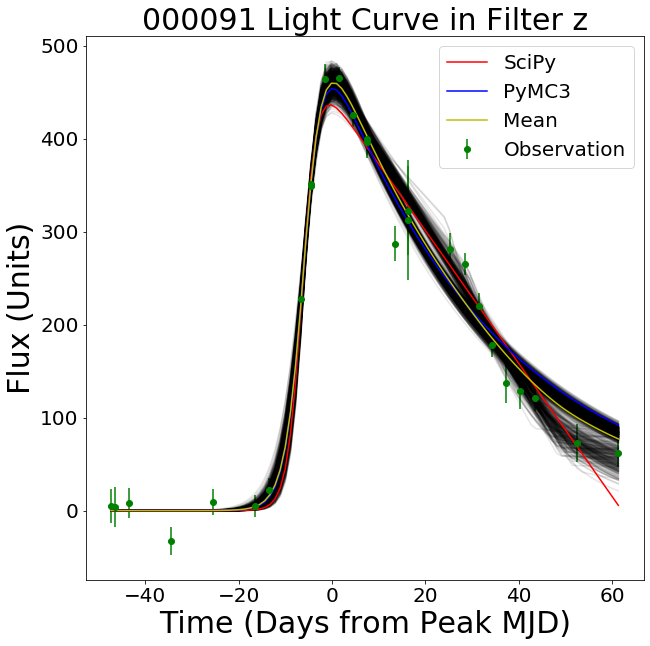

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:23<00:00, 3583.48draws/s]
The number of effective samples is smaller than 10% for some parameters.


                           mean       std        min       25%       50%  \
Log(Amplitude)         2.484166  0.065819   2.243305  2.443640  2.488454   
Tan(Plateau Angle)    -0.754741  0.440479  -1.559946 -1.134283 -0.753376   
Log(Plateau Duration) -0.768852  1.324380  -2.999731 -1.906881 -0.813911   
Start Time            -5.404518  2.014012 -12.185540 -6.743961 -5.537191   
Log(Rise Time)         0.595998  0.130649  -0.957278  0.525188  0.606608   
Log(Fall Time)         1.570119  0.181577  -1.511373  1.530417  1.581624   
sigma                  0.788698  0.594435   0.000065  0.317774  0.668023   

                            75%       max  
Log(Amplitude)         2.528229  2.740667  
Tan(Plateau Angle)    -0.369735 -0.000121  
Log(Plateau Duration)  0.340420  2.583004  
Start Time            -4.224496  5.989657  
Log(Rise Time)         0.681936  1.031242  
Log(Fall Time)         1.631505  2.719002  
sigma                  1.133614  4.072057  
{'Log(Amplitude)': 1.0228902039289685, 

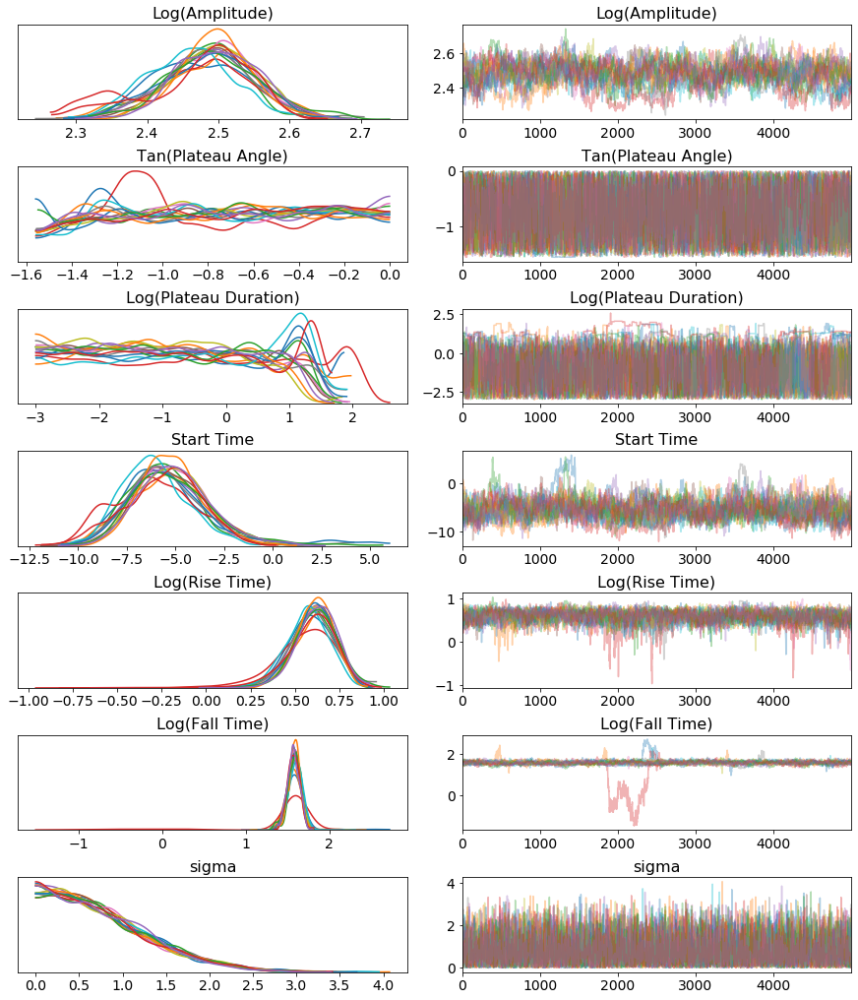

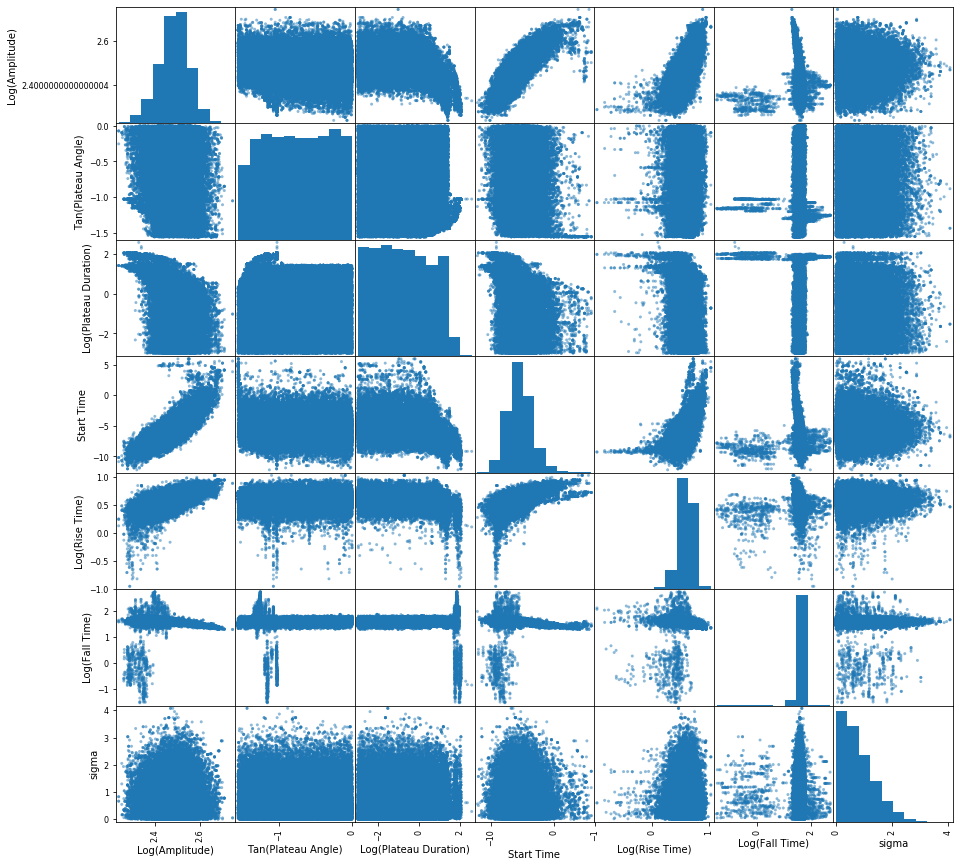

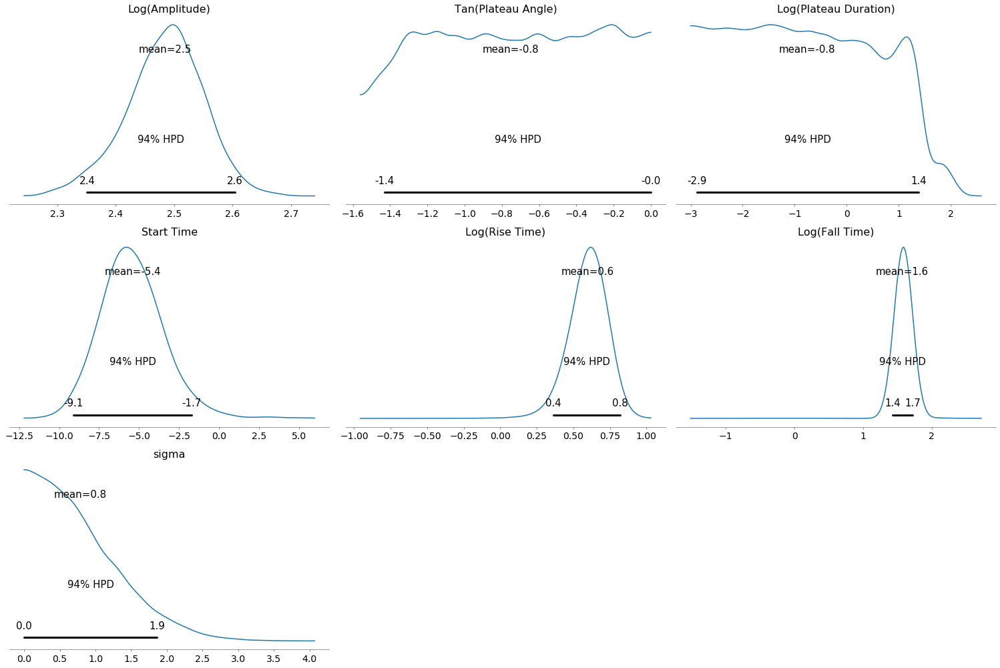

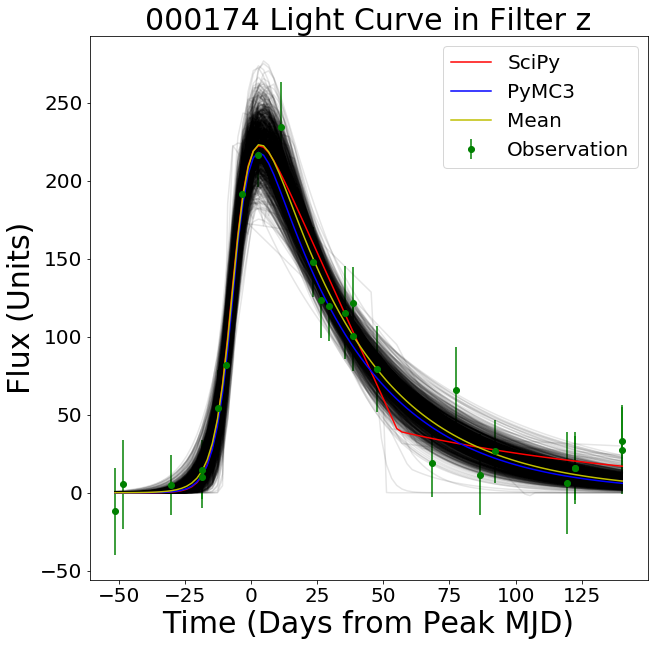

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:24<00:00, 3566.04draws/s]
The number of effective samples is smaller than 10% for some parameters.


                            mean       std        min        25%        50%  \
Log(Amplitude)          2.912408  0.010232   2.864083   2.905557   2.912465   
Tan(Plateau Angle)     -1.334662  0.023193  -1.396739  -1.351138  -1.336810   
Log(Plateau Duration)   1.972477  0.015243   1.879558   1.963501   1.973230   
Start Time            -11.032264  0.195627 -11.823872 -11.163768 -11.034450   
Log(Rise Time)          0.183174  0.049131  -0.032923   0.150077   0.183089   
Log(Fall Time)          1.327045  0.065812   0.918318   1.285797   1.329628   
sigma                   0.804291  0.612591   0.000088   0.321209   0.672064   

                             75%        max  
Log(Amplitude)          2.919284   2.951848  
Tan(Plateau Angle)     -1.320564  -1.128190  
Log(Plateau Duration)   1.981929   2.066379  
Start Time            -10.900641 -10.142706  
Log(Rise Time)          0.216053   0.386162  
Log(Fall Time)          1.371167   1.568827  
sigma                   1.165842   4.378618  

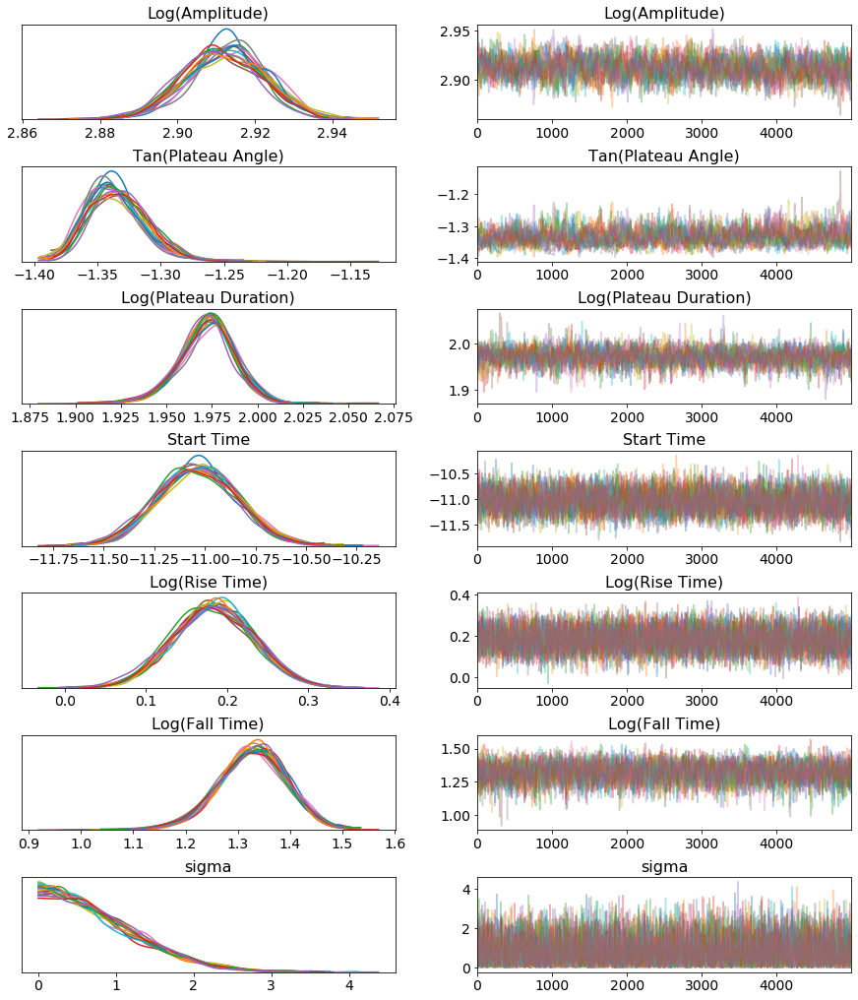

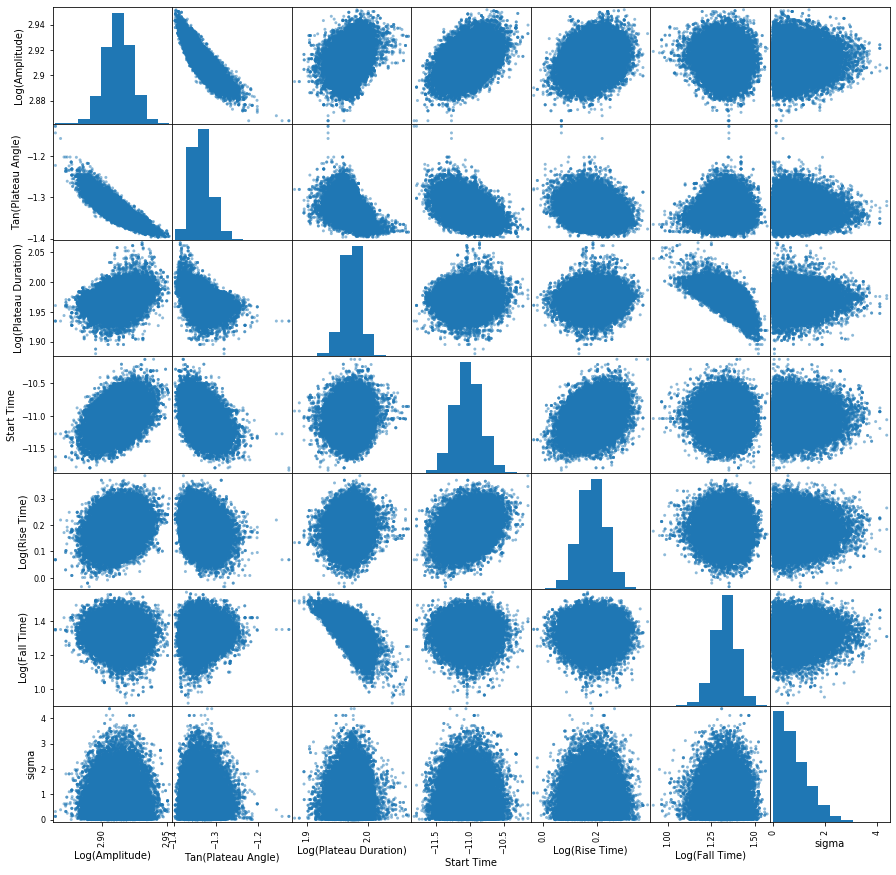

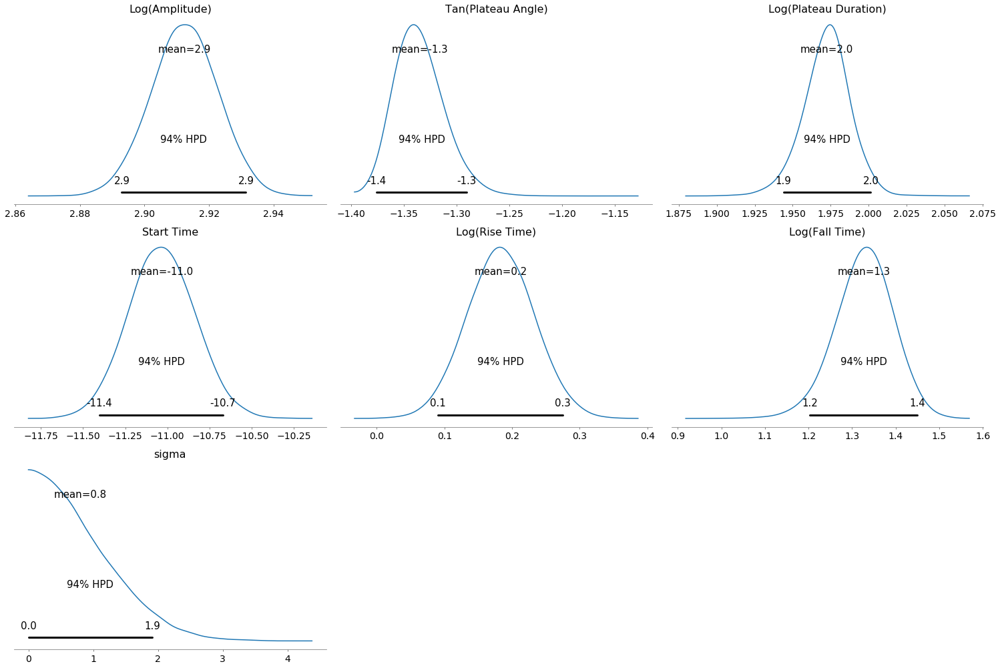

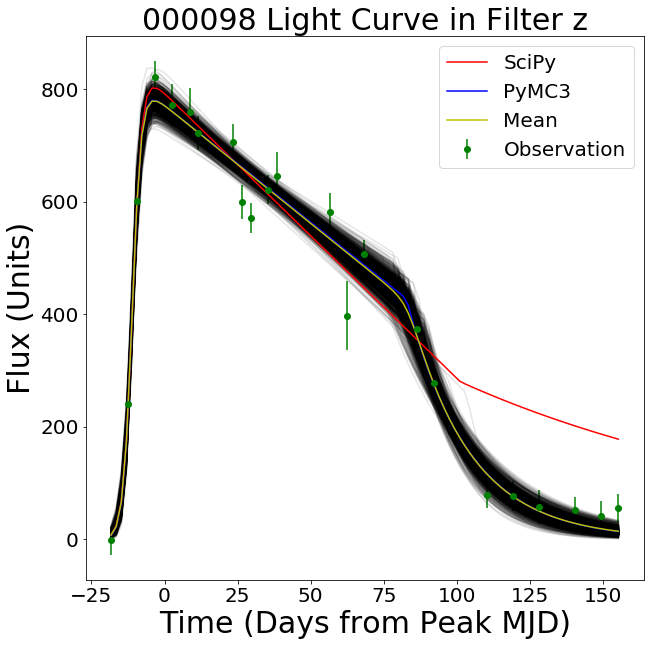

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:24<00:00, 3547.27draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                           mean       std       min       25%       50%  \
Log(Amplitude)         2.575332  0.066922  2.300738  2.544140  2.580528   
Tan(Plateau Angle)    -1.236010  0.348215 -1.558640 -1.412776 -1.363802   
Log(Plateau Duration)  1.349653  0.894063 -2.997669  1.503312  1.645338   
Start Time             3.388884  2.127535 -6.344661  2.567876  3.669247   
Log(Rise Time)         0.433143  0.438528 -2.898079  0.437999  0.523122   
Log(Fall Time)         1.979198  0.210613  1.663763  1.830041  1.937062   
sigma                  0.830025  0.626302  0.000013  0.334417  0.699664   

                            75%        max  
Log(Amplitude)         2.616340   2.759969  
Tan(Plateau Angle)    -1.304413  -0.000378  
Log(Plateau Duration)  1.751496   1.941145  
Start Time             4.644462  14.417879  
Log(Rise Time)         0.599061   0.947818  
Log(Fall Time)         2.057006   2.998515  
sigma                  1.197374   4.443576  
{'Log(Amplitude)': 1.3202056672319498, 

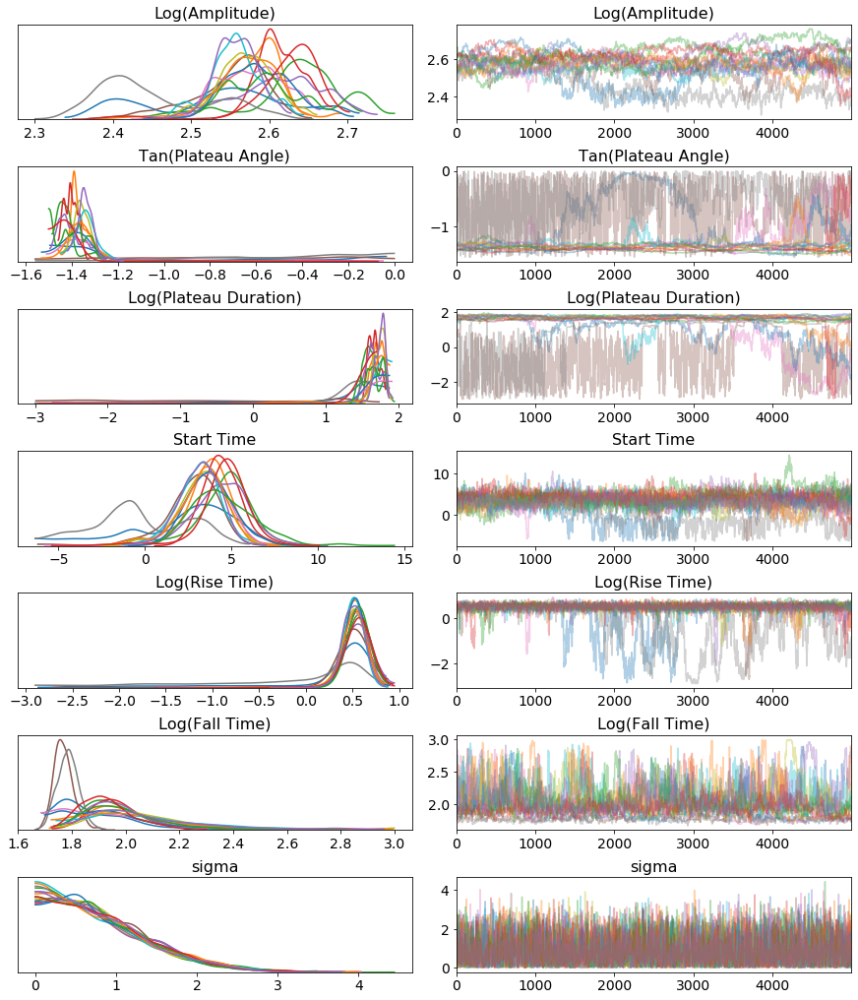

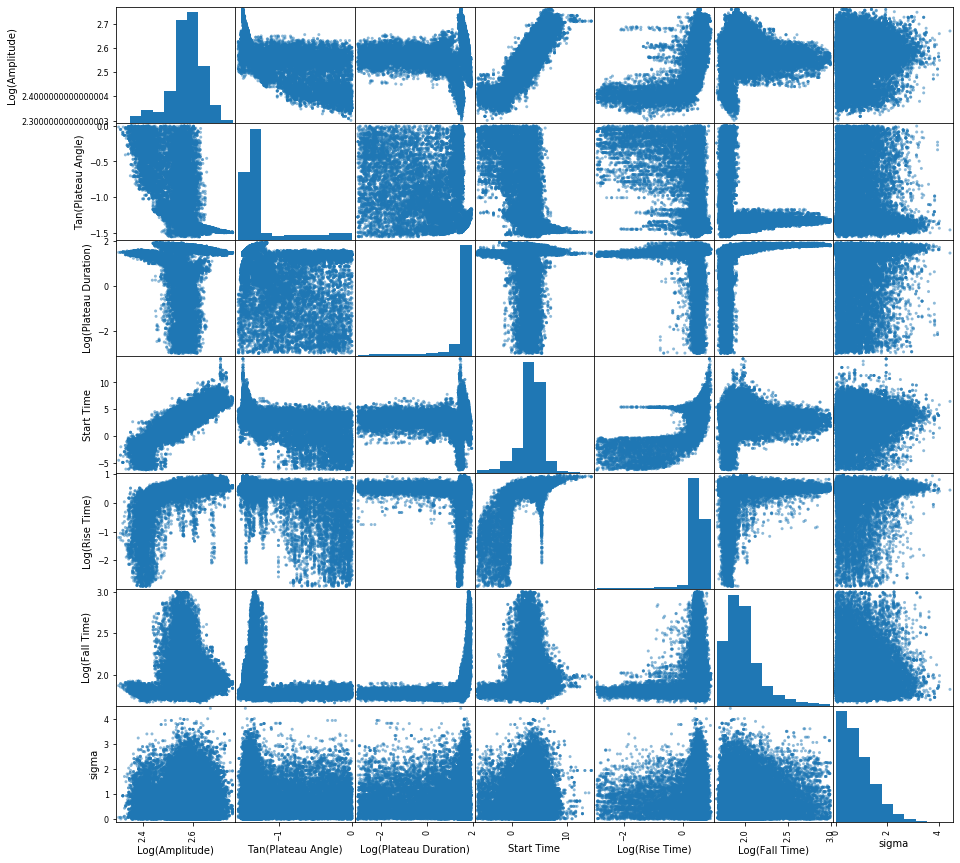

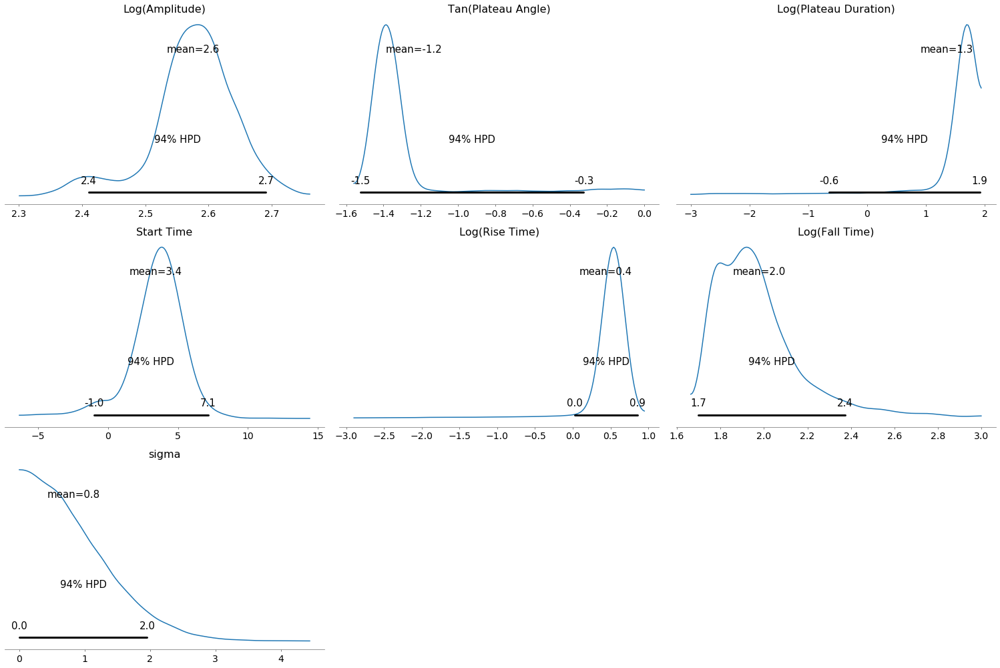

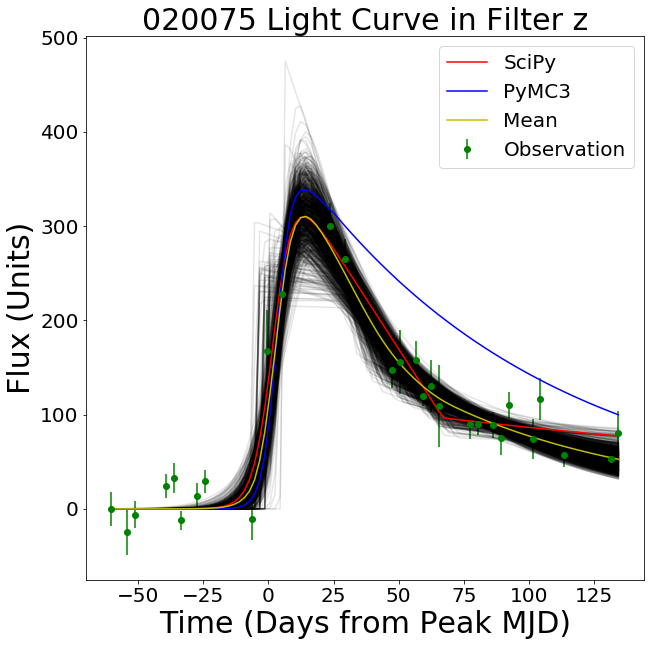

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:25<00:00, 3493.91draws/s]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


                           mean       std        min       25%       50%  \
Log(Amplitude)         2.474975  0.055596   2.317307  2.436900  2.478016   
Tan(Plateau Angle)    -0.791974  0.400869  -1.559530 -1.108859 -0.874508   
Log(Plateau Duration)  0.837406  1.773984  -2.999386 -0.624132  1.639204   
Start Time            -2.285761  4.400479 -28.550160 -3.154872 -1.159492   
Log(Rise Time)         0.215048  0.666493  -2.999071  0.010771  0.423842   
Log(Fall Time)         1.132197  1.597329  -2.999978  0.275999  1.941845   
sigma                  0.793821  0.602641   0.000100  0.318674  0.668696   

                            75%        max  
Log(Amplitude)         2.513421   2.664420  
Tan(Plateau Angle)    -0.462952  -0.000008  
Log(Plateau Duration)  2.280083   2.999741  
Start Time             0.241673  14.445505  
Log(Rise Time)         0.651506   1.019635  
Log(Fall Time)         2.176077   2.999648  
sigma                  1.139726   4.263758  
{'Log(Amplitude)': 1.0376546513

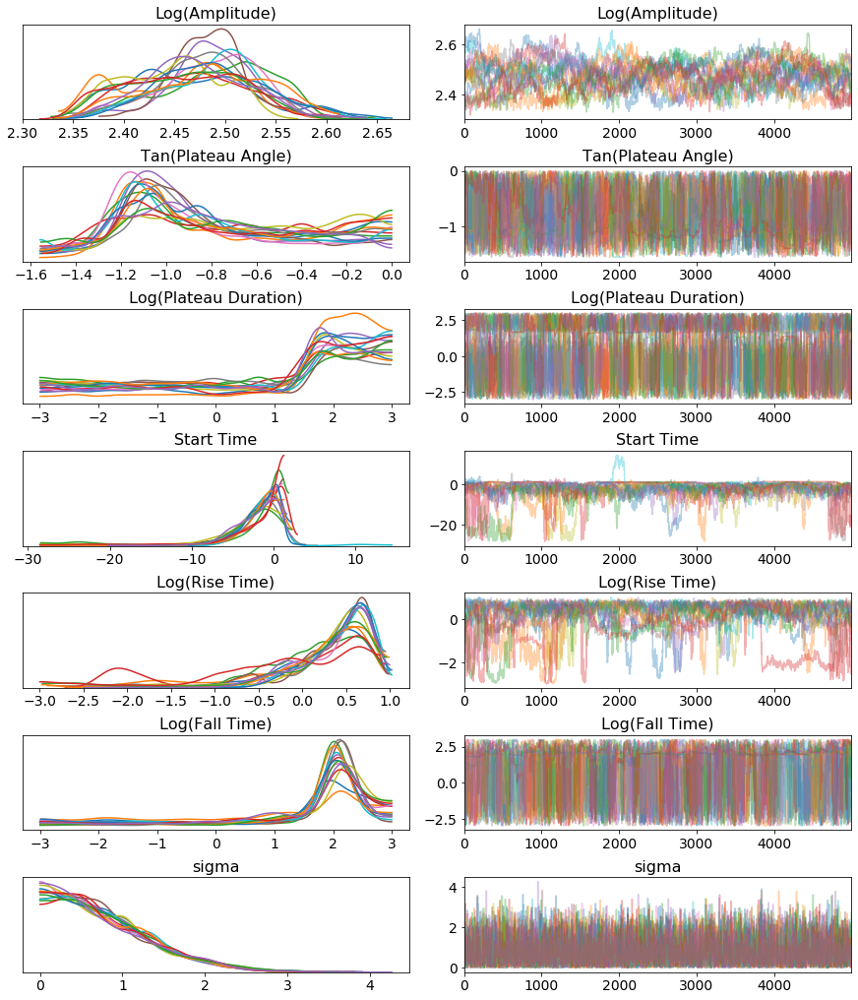

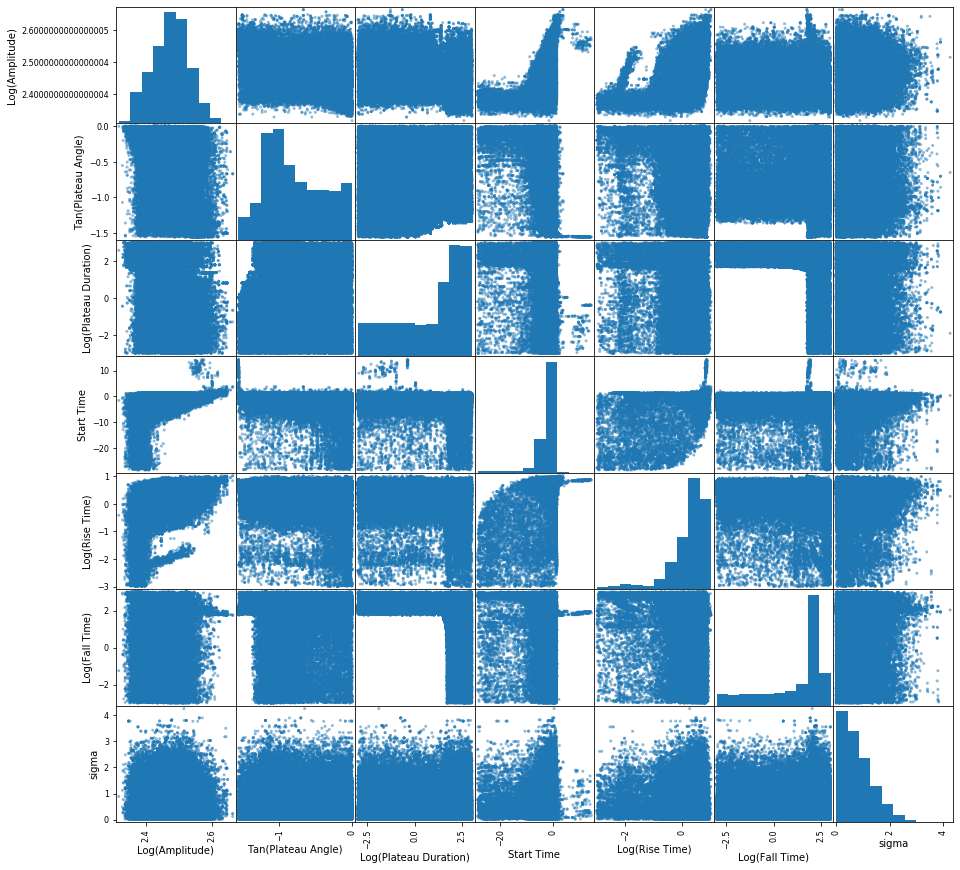

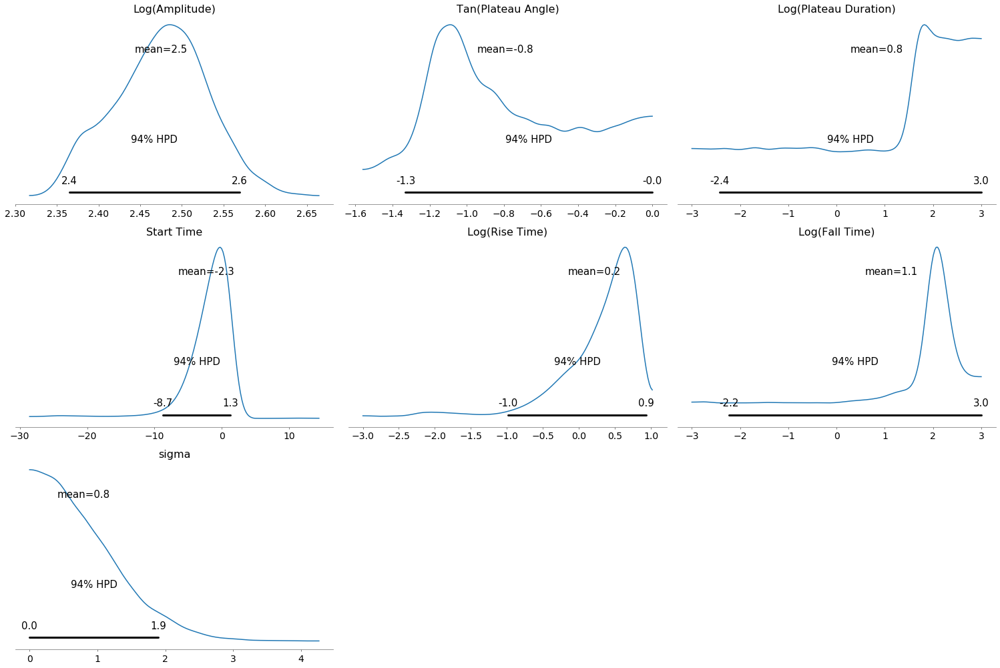

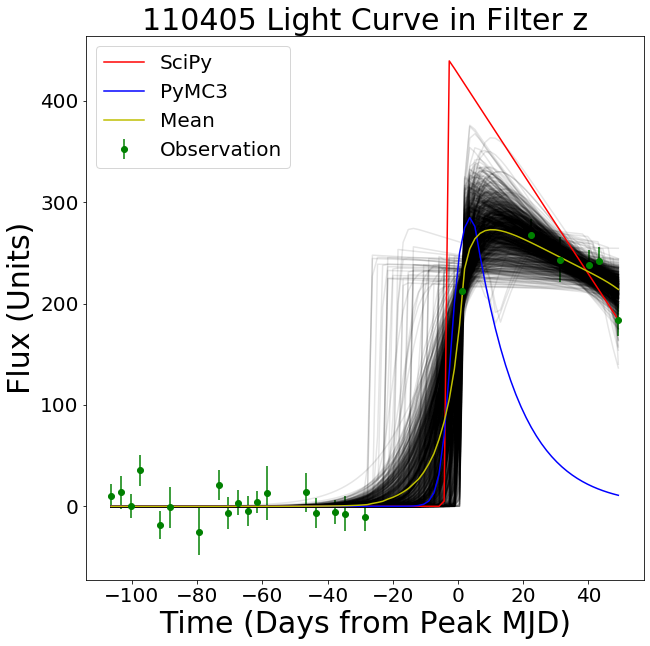

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:31<00:00, 3293.36draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                            mean       std       min        25%        50%  \
Log(Amplitude)          2.541508  0.035466  2.434741   2.519749   2.536336   
Tan(Plateau Angle)     -1.384596  0.396088 -1.559826  -1.551382  -1.546728   
Log(Plateau Duration)  -1.037989  1.571594 -2.999955  -2.228527  -1.445171   
Start Time             19.610954  3.087424  5.314240  19.065550  19.861798   
Log(Rise Time)          0.998546  0.121651  0.802821   0.918026   0.955287   
Log(Fall Time)          2.068664  0.624951 -2.999010   2.121529   2.205312   
sigma                   0.885704  0.669795  0.000093   0.359006   0.751351   

                             75%        max  
Log(Amplitude)          2.555513   2.700254  
Tan(Plateau Angle)     -1.536057  -0.000427  
Log(Plateau Duration)  -0.530649   2.999886  
Start Time             20.802476  36.014908  
Log(Rise Time)          1.016597   1.418139  
Log(Fall Time)          2.269830   2.997779  
sigma                   1.269288   4.702630  
{'Log(A

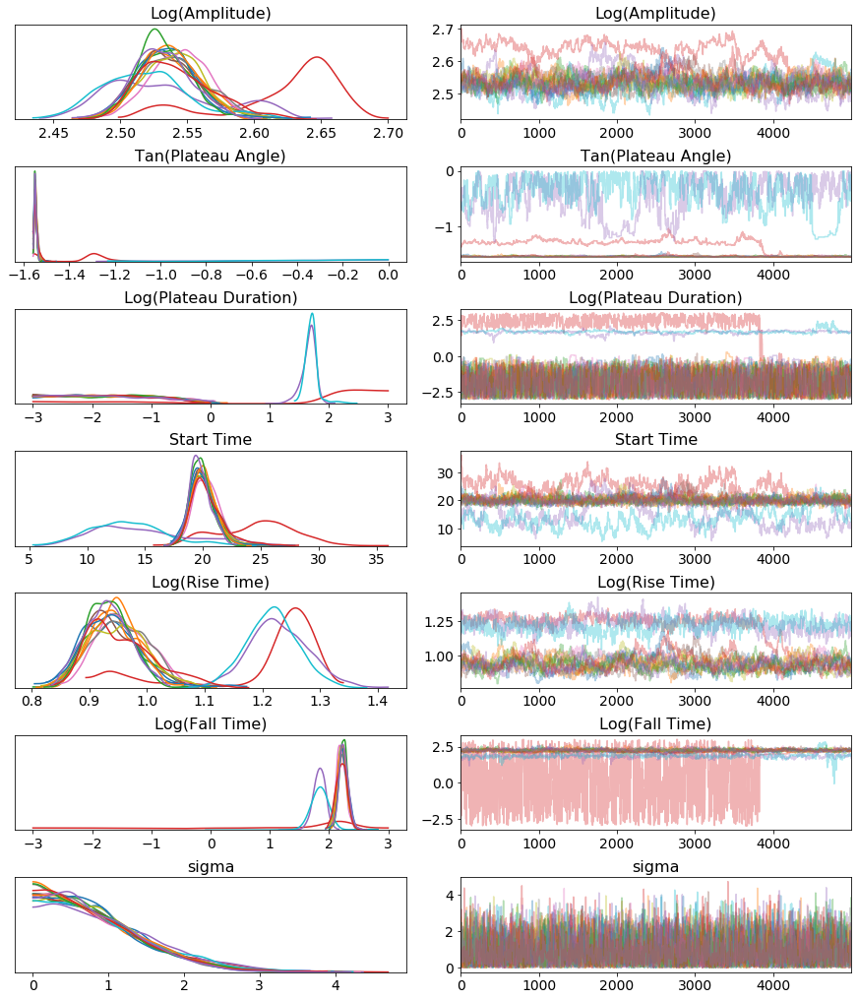

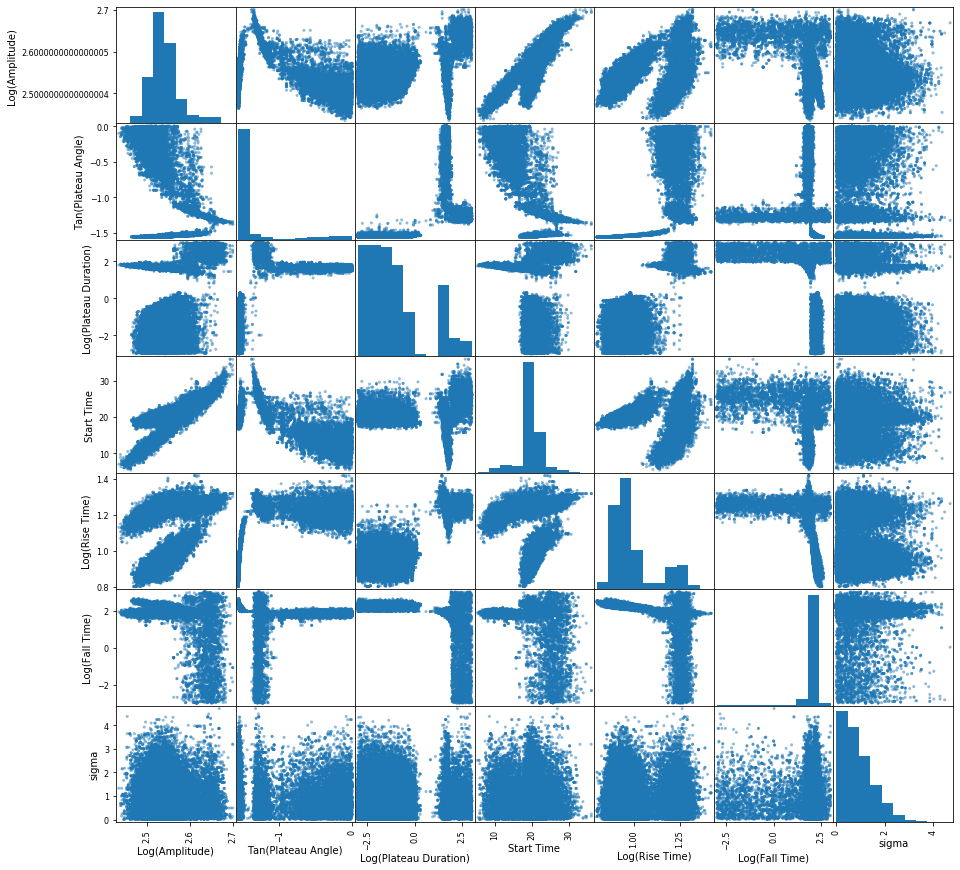

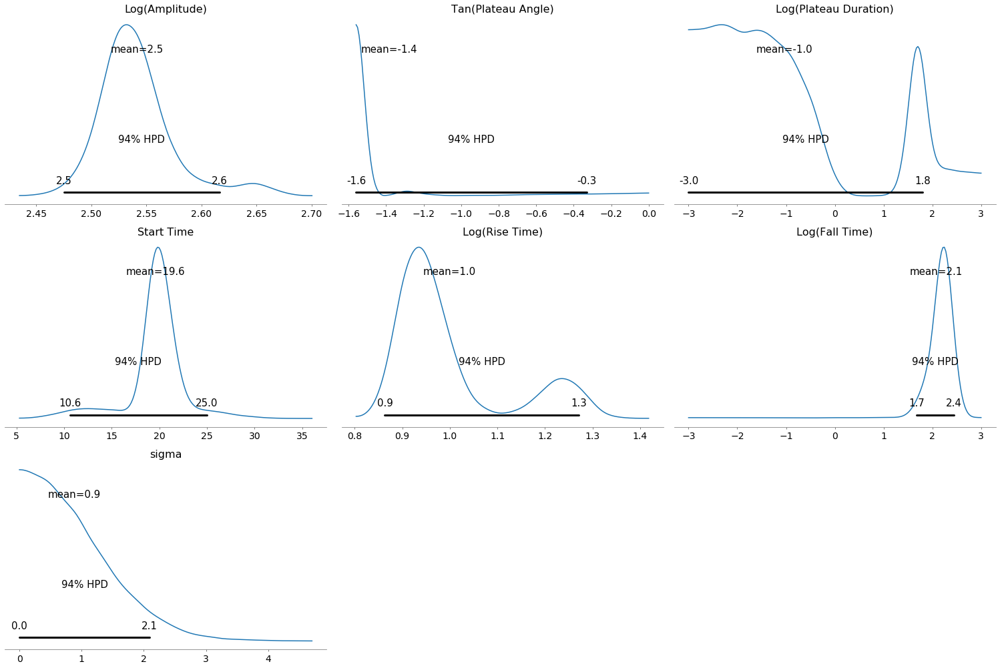

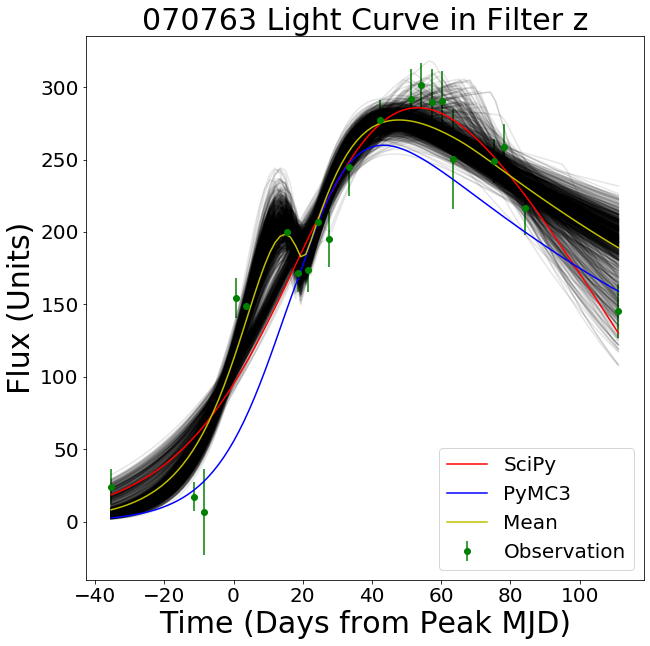

Multiprocess sampling (15 chains in 15 jobs)
CompoundStep
>Metropolis: [sigma]
>Metropolis: [Log(Fall Time)]
>Metropolis: [Log(Rise Time)]
>Metropolis: [Start Time]
>Metropolis: [Log(Plateau Duration)]
>Metropolis: [Tan(Plateau Angle)]
>Metropolis: [Log(Amplitude)]
Sampling 15 chains: 100%|██████████| 300000/300000 [01:27<00:00, 3426.37draws/s]
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


                           mean       std       min       25%       50%  \
Log(Amplitude)         3.029215  0.050381  2.928094  2.975924  3.061153   
Tan(Plateau Angle)    -1.145157  0.509082 -1.559833 -1.541434 -1.539058   
Log(Plateau Duration)  1.022970  0.394334 -1.939861  0.720450  1.321375   
Start Time             1.919853  0.544688  0.652577  1.362992  2.179332   
Log(Rise Time)         0.281118  0.031963  0.158441  0.255848  0.284510   
Log(Fall Time)         1.645696  0.152585  1.418534  1.486036  1.742111   
sigma                  2.454683  2.067873  0.000025  0.736494  1.745105   

                            75%        max  
Log(Amplitude)         3.074963   3.107808  
Tan(Plateau Angle)    -0.731409  -0.000019  
Log(Plateau Duration)  1.350296   1.397433  
Start Time             2.410336   2.978562  
Log(Rise Time)         0.306261   0.370527  
Log(Fall Time)         1.788359   1.920128  
sigma                  4.020899  10.090772  
{'Log(Amplitude)': 3.7697772927572997, 

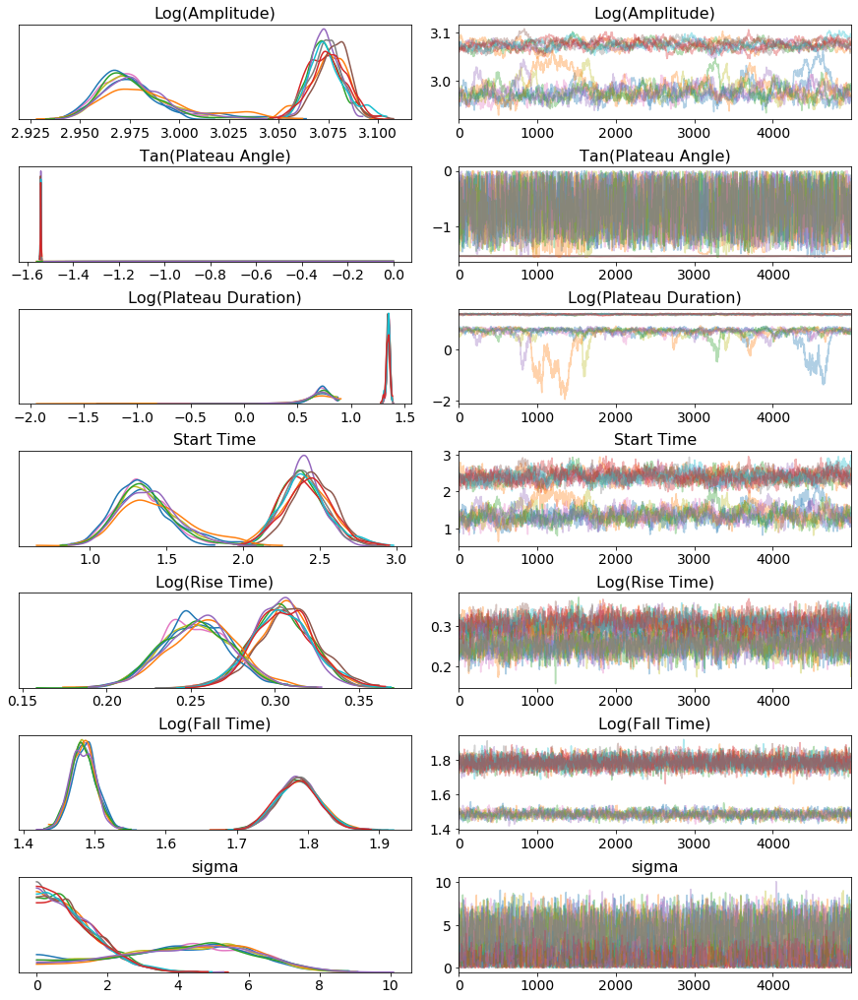

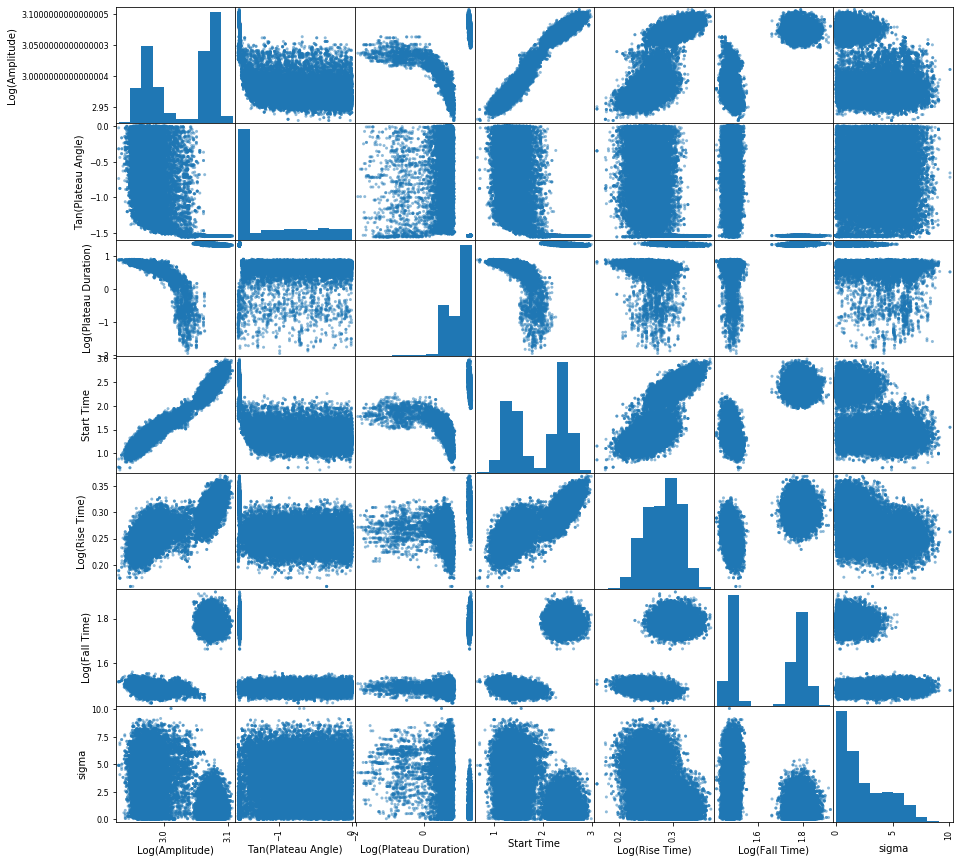

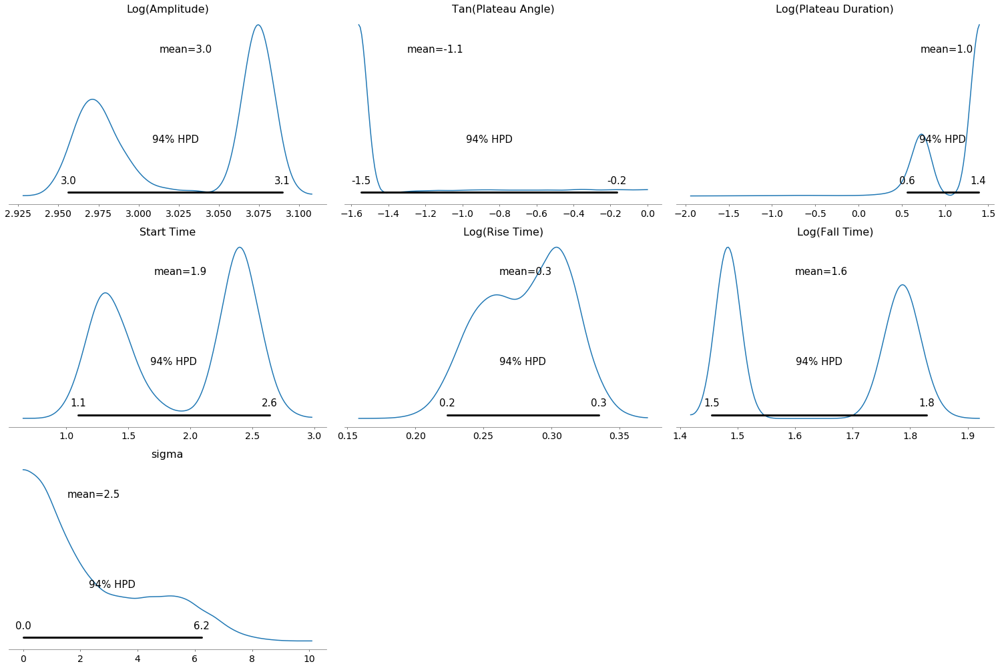

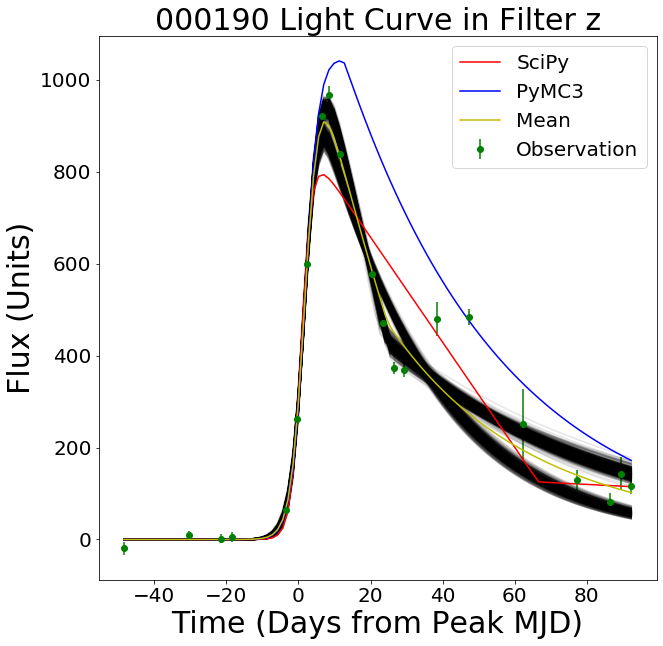

In [18]:
lst_sample = ['000011', '000038', '000091', '000174', '000098', '020075', '110405', '070763', '000190']
for num in lst_sample:
    for fltr in lst_filter:
        if fltr == 'z':
            SNe_LC_MCMC(num, fltr, 5000, 15000, 15)

In [56]:
def mean_parameters(file_num):
    time = np.arange(-50,150)
    file = np.load('/data/reu/fdauphin/NPZ_Files_BIG/PS1_PS1MD_PSc'+file_num+'.npz')
    lst = []
    for i in varname:
        lst.append(file[i])
    lst = np.array(lst)
    lst_mean = np.mean(lst, axis = 3)
    return lst_mean

In [57]:
x = mean_parameters('000098')

In [59]:
y = mean_parameters('000190')

In [58]:
x.shape

(6, 4, 25)

In [60]:
y.shape

(6, 4, 25)

In [85]:
mean_param = []
for i in lst_PS1:
    if i != '530540':
        try:
            mean_param.append(mean_parameters(i))
        except FileNotFoundError as e:
            print (i, 'not found')
mean_param = np.array(mean_param)

000015 not found
000102 not found
000177 not found
000420 not found
010055 not found
010199 not found
010222 not found
010451 not found
020120 not found
020194 not found
030130 not found
040146 not found
040170 not found
040316 not found
040421 not found
040512 not found
040573 not found
040782 not found
050017 not found
050182 not found
050235 not found
060498 not found
061025 not found
061139 not found
061199 not found
070054 not found
070242 not found
070771 not found
070968 not found
071072 not found
080363 not found
080771 not found
090924 not found
092304 not found
100206 not found
110023 not found
120694 not found
130367 not found
130466 not found
130601 not found
130734 not found
130942 not found
140051 not found
140312 not found
150040 not found
150221 not found
150258 not found
150285 not found
150387 not found
150564 not found
150600 not found
151075 not found
160028 not found
160079 not found
160172 not found
160233 not found
170118 not found
180127 not found
180424 not fou

In [88]:
lst = np.concatenate(mean_param, axis = 2)

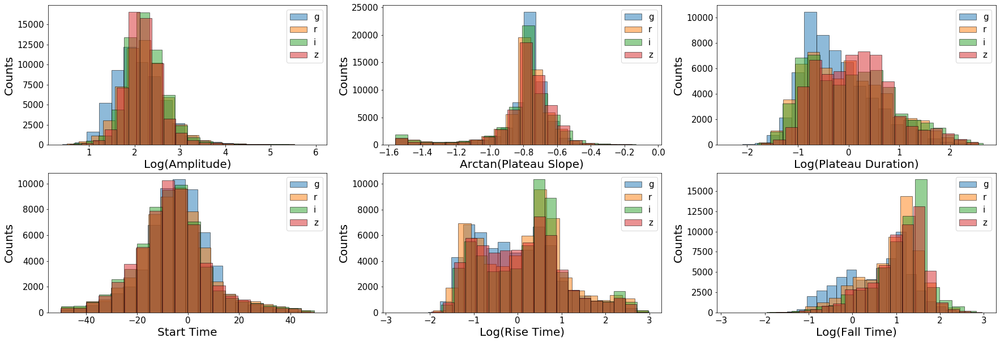

In [108]:
varname = ['Log(Amplitude)', 'Arctan(Plateau Slope)', 'Log(Plateau Duration)', 
           'Start Time', 'Log(Rise Time)', 'Log(Fall Time)']
plt.figure(figsize = (30,10))
plt.title('Histograms of Mean Parameters Values', size = 20)
for i in range (len(lst)):
    plt.subplot(2,3,i + 1)
    plt.xlabel(varname[i], fontsize = 20)
    plt.ylabel('Counts', fontsize = 20)
    plt.tick_params(labelsize = 15)
    for j in range (len(lst[i])):
        plt.hist(lst[i][j], bins = 20, label = lst_filter[j], alpha = 0.5, edgecolor = 'k')
    plt.legend(fontsize = 15)
    #plt.show()

In [117]:
mean = np.round(np.mean(lst, axis = 2), 3)

In [118]:
std = np.round(np.std(lst, axis = 2), 3)

In [125]:
mean

array([[ 2.109,  2.241,  2.254,  2.205],
       [-0.793, -0.811, -0.807, -0.788],
       [-0.208, -0.043,  0.034,  0.123],
       [-4.284, -5.428, -6.51 , -6.324],
       [-0.069,  0.121,  0.194,  0.069],
       [ 0.541,  0.883,  1.105,  1.043]])

In [132]:
10 ** 1.75

56.23413251903491

In [120]:
std

array([[ 0.595,  0.567,  0.489,  0.437],
       [ 0.172,  0.197,  0.22 ,  0.195],
       [ 0.714,  0.82 ,  0.856,  0.75 ],
       [13.001, 14.632, 14.955, 14.449],
       [ 0.944,  0.983,  0.965,  0.936],
       [ 0.761,  0.677,  0.644,  0.635]])

In [18]:
with open('Slurm_Files/000022.slurm') as f:
    text = f.read()

for number in lst_PS1:
    newtext = text.replace('000022', number)

    with open('Slurm_Files/' + number + '.slurm', 'w') as g:
        g.write(newtext)

In [ ]:
for f in *.slurm; do sbatch $f; done